In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import scipy.signal as sgn
from scipy.optimize import minimize

In [2]:
def contour_points_v2(g_img):

    kernel = np.ones((15, 15), np.uint8)
    gradient = cv2.morphologyEx(g_img, cv2.MORPH_GRADIENT, kernel)
    
    blur = cv2.GaussianBlur(gradient + 20, (5, 5), 0)
    ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    gradient_img = np.zeros_like(g_img, dtype=np.uint8)

    contours, _ = cv2.findContours(th3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) < 1:
        return None
    
    cv2.drawContours(gradient_img, contours, -1, 255, 2)

    kernel = np.ones((25, 25),np.uint8)
    gradient_img = cv2.dilate(gradient_img, kernel, iterations = 1)    


    hull_img = np.zeros_like(g_img, dtype=np.uint8)

    blur = cv2.GaussianBlur(g_img, (3, 3), 0)
    ret3, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    contours, _ = cv2.findContours(th3, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) < 1:
        return None
    
    area_cntrs = [cv2.contourArea(cnt) for cnt in contours]
    max_cntr_index = np.argmax(area_cntrs)
    cnt = contours[max_cntr_index]

    hull = cv2.convexHull(cnt)
    cv2.drawContours(hull_img, [hull], 0, 125, 2)

    op = np.logical_and(gradient_img, hull_img).astype(np.uint8)*255

#     op[:10, :] = 0
#     op[-10:, :] = 0

#     kernel = np.ones((3, 3), np.uint8)
#     opening = cv2.morphologyEx(op, cv2.MORPH_OPEN, kernel)
    

#     final_cnt = np.take(final_cnt, list(set(np.random.randint(0, final_cnt.shape[0], size=int(final_cnt.shape[0]/10)))), axis=0)
#     imgs = np.hstack([gradient_img, hull_img, opening])
    
#     if final_cnt.shape[0] > 4:
#         return op
    
#     else:
#         return None
    return op

In [3]:

# Ivo's implemetation of Ellipse class

class Ellipse:

    C : np.array #homogeneous conic matrix x'*C*x=0

    def __init__( self, C : np.array ):

        self.C = C
        

    @classmethod
    def estimate_ellipsoid( cls, points : np.array ):
        """
        C = estimate_ellipsoid_2D ( points )
        ----------------------------------

        estimates a homogeneous ellipsoid C
        
        x'*C*x = 0
        
        from a number of point samples 
        (in a least squares sense)
        
        format of points

                [ x^1_1 . . . . .  x^N_1 ] 
                [  .                 .   ]
        points = [  .                 .   ]
                [  .                 .   ]
                [ x^1_n . . . . .  x^N_n ]
                [  1    . . . . .    1   ]

        where each point is element R^n
        and there are N points, the points  
        have to be in homogeneous coordinates.
        
        """

        n = points.shape[0]
        num_entries = int((n+1) * n/2)
        
        if points.shape[1] < num_entries-1:
            print('insufficient number of points, need at least {}'.format( num_entries-1 ) )
    
        # --------------  estimate ellipse ---------------

        # assemble linear system
        A = np.zeros( [points.shape[ 1 ], num_entries ] )

        #for all points
        for i in range( 0, points.shape[ 1 ] ):
        
            #extract point
            x = np.array([points[:, i]]).T
            #print(x)
            X  = np.matmul( x, x.T )
            #print(X)
            X2 = X.T + X - np.diag( np.diag( X ) )

            #print(X2)
            row = X2[ np.where( np.triu( np.ones( X2.shape ) ) ) ]
            #print(row)

            A[ i, : ] = row

        #print(A)

        #solve for null space 
        U,D,V = np.linalg.svd( A )

        ell = V[-1,:]


        #create conic matrix
        Cd = np.zeros( X2.shape )

        Cd[ np.where( np.triu( np.ones( X2.shape ) ) ) ] = ell

        C = Cd + Cd.T - np.diag( np.diag ( Cd ) )

        #detC =  np.linalg.det( C[0:-1,0:-1] )

        #print(detC)

        if Ellipse.is_hyperboloid( C ):
            print('Warning: result is a hyperboloid!')
        

        if Ellipse.is_paraboloid( C ):
            print('Warning: result is a paraboloid!')
        
        return C

    @classmethod
    def cov_mean_to_ellipsoid( cls, cov, mean, k ):
        """
            C = cov_mean_to_ellipsoid_homog ( Cov, Mean, k )
            ----------------------------------
        
            generates a homogeneous ellipsoid C
            
            x'*C*x = 0
        
            from covariance matrix and mean value
            of a gaussian distribution
            
            k is a confidence factor determibed by the chi^2 
            distribution. The probability that x is inside 
            the ellipsoid is P_{chi^2}(k,2). Some values 
            for k are 2.41 (70%) and k=5.99 (95%).
            
            cov  : np.array - covariance matrix (non-homogeneous)
            mean : np.array - mean value (vector)
            k : float - confidence factor, see above 

        """

        #column vector, assume we get a 1D array
        mean = np.array( [mean] ).T

        SIGMAinv = np.linalg.inv( cov )

        lastentry = np.matmul( mean.T, np.matmul( SIGMAinv, mean ) ) - k 
        C = np.vstack( [ np.hstack( [ SIGMAinv, -np.matmul(SIGMAinv, mean)] ), 
                         np.hstack( [ -np.matmul(mean.T,SIGMAinv), lastentry] ) ] )
        
        return C

    @classmethod
    def srt_to_ellipsoid( cls, S, R, T ): 
        """
         C = srt_to_ellipsoid_homog ( S, R, T )
         ----------------------------------
        
         generates a homogeneous ellipsoid C
         
         x'*C*x = 0
        
         from translation, rotation and scale parts as
        
         x'* (T^-1 * R^-1 * S^-1) ( S * R * T ) x = 0
        
         see: Ivo Ihrke: "Some Notes on Ellipses", TechReport, 2004
        """
        #function C = srt_to_ellipsoid_homog ( S, R, T )


        invT = np.linalg.inv( T )
        invR = R.T
        invS = np.linalg.inv( S )

        left  = np.matmul( invT.T, np.matmul( invR.T, invS.T ) )
        right = np.matmul( invS, np.matmul( invR, invT ) )

        C = np.matmul( left, right )
    
        return C



    @classmethod
    def decompose_ellipsoid( cls, C ):
        """
        
         [S,R,T] = decompose_ellipsoid_homog ( C )
         ----------------------------------
        
         decomposes a homogeneous ellipsoid C
         
         x'*C*x = 0
        
         into translation, rotation and scale parts
        
         x'* (T^-1 * R^-1 * S^-1) ( S * R * T ) x = 0
        
         Note that C \neq (T^-1 * R^-1 * S^-1) ( S * R * T )
         in some cases because the orientation of 
         the ellipsoid's major axis is not fixed.
         The function generates a right handed system.

        """

        #print(C)
        C_ih = C[0:-1,0:-1] 
        #print(C_ih)

        t = -np.matmul( np.linalg.pinv( C_ih ), C[0:-1,-1] )

        T = np.eye( C.shape[ 0 ] )
        T[0:-1, -1 ] = t

        U,D,V = np.linalg.svd( C_ih )

        R = np.eye( C.shape[ 0 ] )
        R[0:-1,0:-1] = V


        #S = R' * T' * C * T * R;
        S = np.matmul( R.T, np.matmul( T.T, np.matmul( C, np.matmul( T, R ) ) ) )

        S = S / S[-1,-1]

        S = np.sqrt( np.diag(1/abs(np.diag(S))))

        return S, R, T

    @classmethod
    def is_ellipsoid( cls, C ):
        """
         bool = is_ellipsoid_homog ( C )
         ----------------------------------
        
         determines whether homogeneous conic C
         
         x'*C*x = 0
         
         is an ellipsoid
        """

        #function val = conic_is_ellipsoid_homog ( C )

        detC =  np.linalg.det( C[0:-1,0:-1] )

        return detC > 0


    @classmethod
    def is_hyperboloid( cls, C ):
        """
         bool = is_hyperboloid_homog ( C )
         ----------------------------------
        
         determines whether homogeneous conic C
         
         x'*C*x = 0
         
         is a hyperboloid
        """

        
        detC =  np.linalg.det( C[0:-1,0:-1] )

        return detC < 0

    @classmethod
    def is_paraboloid( cls, C ):
        """
         bool = is_paraboloid_homog ( C )
         ----------------------------------
        
         determines whether homogeneous conic C
         
         x'*C*x = 0
         
         is a paraboloid
        """

        
        detC =  np.linalg.det( C[0:-1,0:-1] )

        #maybe with EPS ?
        return detC == 0


    def get_center( self ):
        
        S,R,T = self.decompose_ellipsoid( self.C )


        return [ T[2,0], T[2,1] ]


    def plot( self, ax, **kwargs ):
        """
        plot_ellipsoid_2D ( C, style, N )
        ----------------------------------
        
        plots a homogeneous ellipsoid C
        
        x'*C*x = 0
        
        style is a matlab plot style, e.g. 'b-' (default)
        N is the number of polygon segments to 
        approximate the ellipse
        """

        #function plot_ellipsoid_homog_2d ( C, style, N )

        if not 'style' in locals():
            style = 'b-'

        if not 'N' in locals():
            N = 100



        angles = np.linspace( -np.pi, np.pi, N )

        # generate a unit circle or a unit hyperbola
        if ( Ellipse.is_ellipsoid( self.C ) ):
            #uc  = [ cos(x); sin(x); ones(size(x)) ];
            x  = np.cos( angles )
            y  = np.sin( angles )
            w  = np.ones( angles.shape )

            uc = np.vstack([x,y,w])

        else:
            EPS = 0.1
            x   =  np.linspace( -np.pi/2+EPS, np.pi/2-EPS, int( N/2 ) )#-(pi/2-EPS):((pi-2*EPS)/(N/2)):(pi/2-EPS);
            x2  =  np.linspace( np.pi/2+EPS, 3*np.pi/2-EPS, int( N/2 ) )  #x2 =  (pi/2+EPS):((pi-2*EPS)/(N/2)):(3*pi/2-EPS);
            uc  = np.vstack( [ 1/np.cos(x), np.tan(x), np.ones( x.shape ) ] )
            uc2 = np.vstack( [ 1/np.cos(x2), np.tan(x2), np.ones( x2.shape ) ] )
        
        #decompose
        S,R,T = Ellipse.decompose_ellipsoid( self.C )

        #transform unit circle or parabola 
        transform = np.matmul( T, np.matmul( R, S ) )
        ell  =  np.matmul( transform, uc )

        if 'uc2' in locals():
            ell2  =  np.matmul( transform, uc2 )
            ax.plot( ell2[0,:], ell2[1,:], style )

   
        #plot conic
        ax.plot( ell[0,:], ell[1,:], style )

        #plot coordinate system
        tx = T[0,2]
        ty = T[1,2]
        
#         print(tx, ty)

        smin = S[0,0]
        smaj = S[1,1] 

        ax.plot( np.array( [ tx, tx+smin*R[0,0] ] ), np.array( [ ty, ty+smin*R[1,0] ] ), 'r' )
        ax.plot( np.array( [ tx, tx+smaj*R[0,1] ] ), np.array( [ ty, ty+smaj*R[1,1] ] ), 'b' )

        ax.set_aspect('equal', adjustable='box')
        return (tx, ty)

In [4]:
def fit_ellipse_3(img_name, img_8, g_img_8, ifHull=False, date_now="", method="ivo", save_path=None):
        """ Find and fit an ellipse in an image.
        it should be run on a normalized image I (normalization should exclude dead pixels which are artificially maximum)
        Parameters
        ----------
        path_dir_w_time : str
            _description_
        date_now : str
            _description_

        Returns
        -------
        Ellipse
            Ellipse in an image.
        """

        ellipsoid_points=[]
           
        img = np.array(g_img_8, dtype=np.uint8)
        op = contour_points_v2(img)
        
        op[:20, :] = 0
        op[-20:, :] = 0
        
        op[:, :20] = 0
        op[:, -20:] = 0
        
#         plt.imshow(op)
#         plt.show()
        
        x, y = np.where(op > 1)
        final_cnt = np.vstack([y, x]).T
        
        if final_cnt.shape[0] > 10000:
            final_cnt = np.take(final_cnt, list(set(np.random.randint(0, final_cnt.shape[0], size=10000))), axis=0)

        if final_cnt is None:
            return None, None, None
        else:
            ellipsoid_points = np.array(final_cnt).reshape([-1, 2])
            
        
        ellipsoid_points = np.array(ellipsoid_points).astype('float').T
        ellipsoid_points = np.vstack( [ellipsoid_points, np.ones(ellipsoid_points.shape[1])] )
#         print(ellipsoid_points)
            
        is_det_ellipse = True
        if method == "ivo":
            E = Ellipse( Ellipse.estimate_ellipsoid( ellipsoid_points ) )
            
            if Ellipse.is_ellipsoid( E.C ):
                S,R,T = Ellipse.decompose_ellipsoid(E.C)

                tx = T[0,2]
                ty = T[1,2]

                smin = S[0,0]
                smaj = S[1,1]
                
#                 f = E.C[-1, -1]
                f = np.arctan2(R[1,0], R[0, 0])
#                 print(theta)
#                 print(E.C)
            else:
                is_det_ellipse = False
        else:
            if len(ellipsoid_points[:2, :].T) > 5:
                (tx, ty), (smin, smaj), f = cv2.fitEllipse(ellipsoid_points[:2, :].T.astype(np.int32))
                smin, smaj = smin/2, smaj/2
            else:
                return None, None, None


#         print((tx, ty), (smin, smaj), f)
        
        
#             
        if is_det_ellipse:
            for i in range( 0, ellipsoid_points.shape[1] ):
                draw_cross(img_8, (ellipsoid_points[0,i],ellipsoid_points[1,i]), (0, 0, 255), length=20, thickness=5)
        
            cv2.ellipse(img_8, (int(tx), int(ty)), (int(smin), int(smaj)), f, 0, 360, (255, 0, 0), 5)

            draw_cross(img_8, (tx, ty), (0, 255, 0))

#             plt.imshow(img_8)
#             plt.show()
            # cv2.imshow('Resized Image', cv2.resize(img_8, (1080, 720), interpolation = cv2.INTER_LINEAR))
            # cv2.waitKey(0)
            # cv2.destroyAllWindows()
            
            if save_path is not None:
            
                cv2.imwrite(f'{save_path}/{img_name[:-5]}.png', img_8)
        
            return (int(tx), int(ty)), (int(smin), int(smaj)), f
        else:
            return None, None, None

In [6]:
def draw_cross(img, cord, color, length=50, thickness=10):
    
    x, y = int(cord[0]), int(cord[1])
    cv2.line(img, (x-length, y-length), (x+length, y+length), color, thickness)
    cv2.line(img, (x+length, y-length), (x-length, y+length), color, thickness)
    
    return img

In [6]:
# # grid based on thumbnail images
# fit_range = np.zeros([7, 7], dtype=np.uint8)
# center_cords = np.zeros([7, 7, 2], dtype=np.float64)
# axis_lens = np.zeros([7, 7, 2], dtype=np.float64)
# save_arr_dir = 'C:/Users/Kazim/Desktop/Overall/VignettingCircleDetection/savedarrays/091123_ellipse_cv2_fit_tiff_size/'

# save_dir = "C:/Users/Kazim/Desktop/Overall/VignettingCircleDetection/310823_ellipse_cv2_fit_tiff_size"
# for x in range(12, 19):
#     for y in range(12, 19):

#         dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
#         file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"
#         print('x:', x, 'y:', y, file_path)
        
#         img = cv2.imread(dir_path + file_path, cv2.IMREAD_UNCHANGED)
#         _, g_img, _ = cv2.split(img)

#         img_8 = cv2.convertScaleAbs(img, alpha=(255/65535))
#         g_img_8 = cv2.convertScaleAbs(g_img, alpha=(255/65535))
        
#         center, axis_size, f = fit_ellipse_3(file_path, img_8, g_img_8, ifHull=True, method='opencv', save_path=save_dir)
        
#         if center is not None:
            
#             good_fit = input("Is it a good fit?")
#             fit_range[x-12, y-12] = int(good_fit)
#             center_cords[x-12, y-12] = center
#             axis_lens[x-12, y-12] = axis_size ## min, max

# # np.savetxt(f'{save_arr_dir}fit_range.txt', fit_range.reshape(-1))
# # np.savetxt(f'{save_arr_dir}center.txt', center_cords.reshape([-1, 2]))
# # np.savetxt(f'{save_arr_dir}axis_lens.txt', axis_lens.reshape([-1, 2]))

x: 12 y: 12 2023_03_15_16_02_07_img_shutter_05_x_12_y_12_r_0_g_1_b_0.tiff
x: 12 y: 13 2023_03_15_16_02_07_img_shutter_05_x_12_y_13_r_0_g_1_b_0.tiff
x: 12 y: 14 2023_03_15_16_02_07_img_shutter_05_x_12_y_14_r_0_g_1_b_0.tiff
x: 12 y: 15 2023_03_15_16_02_07_img_shutter_05_x_12_y_15_r_0_g_1_b_0.tiff
x: 12 y: 16 2023_03_15_16_02_07_img_shutter_05_x_12_y_16_r_0_g_1_b_0.tiff
x: 12 y: 17 2023_03_15_16_02_07_img_shutter_05_x_12_y_17_r_0_g_1_b_0.tiff
x: 12 y: 18 2023_03_15_16_02_07_img_shutter_05_x_12_y_18_r_0_g_1_b_0.tiff
x: 13 y: 12 2023_03_15_16_02_07_img_shutter_05_x_13_y_12_r_0_g_1_b_0.tiff
x: 13 y: 13 2023_03_15_16_02_07_img_shutter_05_x_13_y_13_r_0_g_1_b_0.tiff
x: 13 y: 14 2023_03_15_16_02_07_img_shutter_05_x_13_y_14_r_0_g_1_b_0.tiff
x: 13 y: 15 2023_03_15_16_02_07_img_shutter_05_x_13_y_15_r_0_g_1_b_0.tiff
x: 13 y: 16 2023_03_15_16_02_07_img_shutter_05_x_13_y_16_r_0_g_1_b_0.tiff
x: 13 y: 17 2023_03_15_16_02_07_img_shutter_05_x_13_y_17_r_0_g_1_b_0.tiff
x: 13 y: 18 2023_03_15_16_02_07_img_sh

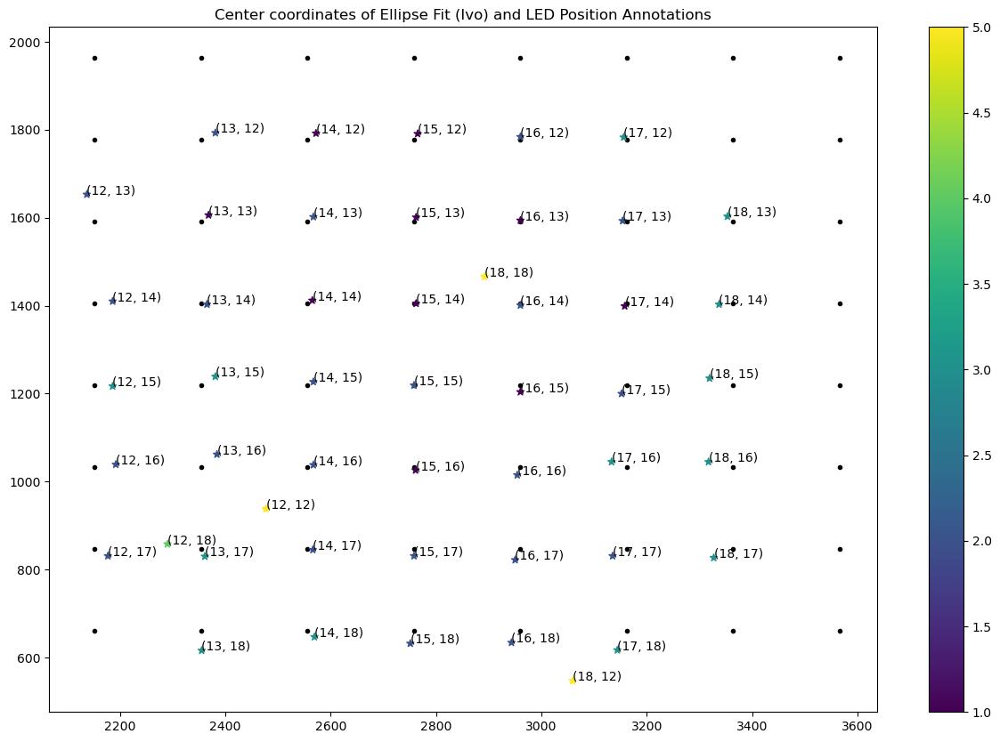

In [9]:
plt.figure(figsize=(15, 10))

center_leds = center_cords[3, 3]
y_unit_len = center_cords[3, 2][1] - center_cords[3, 3][1] 
x_unit_len = center_cords[4, 3][0] - center_cords[3, 3][0]

center_leds, y_unit_len, x_unit_len

x_axis = [center_leds[0] - i*x_unit_len for i in range(-4, 4)]
y_axis = [center_leds[1] - i*y_unit_len for i in range(-4, 4)]

xx, yy = np.meshgrid(x_axis, y_axis)
plt.scatter(xx, yy, marker=".", color='black')

x_cords = [x if x != 0.0 else np.nan for x in center_cords.reshape([-1, 2])[:, 0]]
y_cords = [y if y != 0.0 else np.nan for y in center_cords.reshape([-1, 2])[:, 1]]
fit_range_2 = [y if y != 0 else np.nan for y in fit_range.reshape(-1)]


plt.scatter(x_cords, y_cords, marker="*", c=fit_range_2)
# plt.grid()

count = 0
for x in range(12, 19):
    for y in range(12, 19):
        plt.annotate(f"({x}, {y})",(x_cords[count], y_cords[count]), fontsize=10)
        count += 1

plt.title("Center coordinates of Ellipse Fit (Ivo) and LED Position Annotations")
# plt.xlim(210, 350)
# plt.ylim(40, 200)
plt.colorbar()
plt.show()

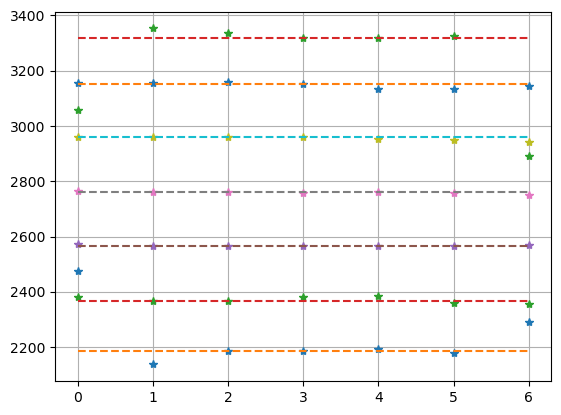

2186.0
Difference: 2186.0
2368.0
Difference: 182.0
2567.0
Difference: 199.0
2761.0
Difference: 194.0
2960.0
Difference: 199.0
3152.0
Difference: 192.0
3319.0
Difference: 167.0


In [49]:
plt.plot(center_cords.reshape([-1, 2])[:7, 0], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[:7, 0]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[7:14, 0], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[7:14, 0]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[14:21, 0], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[14:21, 0]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[21:28, 0], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[21:28, 0]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[28:35, 0], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[28:35, 0]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[35:42, 0], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[35:42, 0]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[42:, 0], '*')
np.median(center_cords.reshape([-1, 2])[i:i+7, 0])

plt.grid()
plt.show()
tmp0 = 0
for i in range(0, 49, 7):
    tmp1 = np.median(center_cords.reshape([-1, 2])[i:i+7, 0])
    print(tmp1)
    print(f'Difference: {tmp1 - tmp0}')
    tmp0 = tmp1

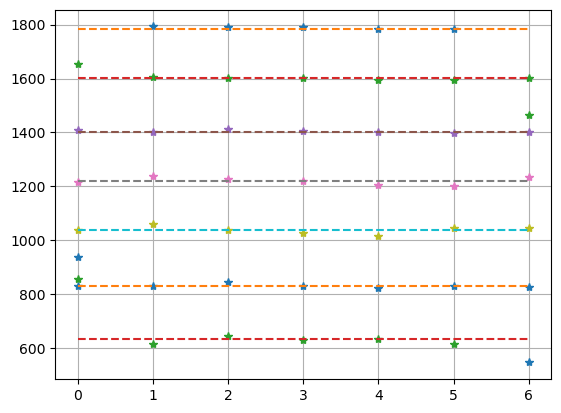

1784.0
Difference: -1784.0
1602.0
Difference: 182.0
1403.0
Difference: 199.0
1219.0
Difference: 184.0
1039.0
Difference: 180.0
831.0
Difference: 208.0
634.0
Difference: 197.0


In [53]:
plt.plot(center_cords.reshape([-1, 2])[0::7, 1], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[0::7, 1]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[1::7, 1], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[1::7, 1]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[2::7, 1], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[2::7, 1]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[3::7, 1], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[3::7, 1]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[4::7, 1], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[4::7, 1]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[5::7, 1], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[5::7, 1]).repeat(7), '--')
plt.plot(center_cords.reshape([-1, 2])[6::7, 1], '*')
plt.plot(np.median(center_cords.reshape([-1, 2])[6::7, 1]).repeat(7), '--')

plt.grid()
plt.show()
tmp0 = 0
for i in range(7):
    tmp1 = np.median(center_cords.reshape([-1, 2])[i::7, 1])
    print(tmp1)
    print(f'Difference: {-tmp1 + tmp0}')
    tmp0 = tmp1

In [14]:
save_arr_dir = 'C:/Users/Kazim/Desktop/Overall/VignettingCircleDetection/savedarrays/091123_ellipse_cv2_fit_tiff_size/'
center_cords = np.loadtxt(save_arr_dir+'center.txt').reshape([7, 7, 2])

In [21]:
origin = center_cords[3, 3]
y_unit = center_cords[3, 2][1] - center_cords[3, 3][1] 
x_unit = center_cords[4, 3][0] - center_cords[3, 3][0]

origin, y_unit, x_unit

x_axis = [origin[0] - i*x_unit for i in range(-3, 4)]
y_axis = [origin[1] - i*y_unit for i in range(-3, 4)]

xx, yy = np.meshgrid(x_axis, y_axis)
xx, yy = xx[:, ::-1].T, yy.T

undistorted_points = np.zeros_like(center_cords)
undistorted_points[:, :, 0] = xx
undistorted_points[:, :, 1] = yy

undistort_center = undistorted_points[3, 3]

undistorted_points = (undistorted_points - undistort_center).reshape([-1, 2])
distorted_points = (center_cords - center_cords[3, 3]).reshape([-1, 2])

undistorted_points = np.delete(undistorted_points, [0, 6, -7, -1], axis=0)
distorted_points = np.delete(distorted_points, [0, 6, -7, -1], axis=0)

In [20]:
undistort_center[0]

2758.0

In [22]:
r_ud = np.sqrt((undistorted_points[:, 0])**2  + (undistorted_points[:, 1])**2)
theta_ud = np.arctan2(undistorted_points[:, 1], undistorted_points[:, 0])

r = np.sqrt((distorted_points[:, 0])**2  + (distorted_points[:, 1])**2).reshape(-1)
theta = np.arctan2(distorted_points[:, 1], distorted_points[:, 0]).reshape(-1)

In [546]:
# # x′=f(r)⋅cos(θ)+xc 
# # y′=f(r)⋅sin(θ)+yc

# # r=(x−xc)2+(y−yc)2
# # θ=tan(y−ycx−xc)

# # f(r)=r⋅(1+p1⋅r+p2⋅r2+⋯pN⋅rN)

# num_params = 8
# step = 1
# kx = []
# ky = []

# mat = np.array([r_ud**j for j in range(2, num_params+1, step)]).T
# # mat = np.hstack((mat, (undistorted_points[:, 0]*undistorted_points[:, 1]*r_ud).reshape((-1, 1))))

# k = np.matmul(np.linalg.pinv(mat), r-r_ud)
# print(k)

# x_estd = (r_ud + np.sum([k[i]*r_ud**j for i, j in enumerate(range(2, num_params+1, step))], axis=0))*np.cos(theta_ud) + center_cords_undis[3, 3, 0]
# y_estd = (r_ud + np.sum([k[i]*r_ud**j for i, j in enumerate(range(2, num_params+1, step))], axis=0))*np.sin(theta_ud) + center_cords_undis[3, 3, 1]

# plt.scatter(x_estd, y_estd, color='green')
# plt.scatter(distorted_points[:, 0], distorted_points[:, 1], color='red')
# # plt.scatter(undistorted_points[:, 0], undistorted_points[:, 1], color='blue')
# plt.grid()

In [547]:
# x_axis = [origin[0] - i*x_unit for i in range(-5, 6)]
# y_axis = [origin[1] - i*y_unit for i in range(-5, 6)]

# xx, yy = np.meshgrid(x_axis, y_axis)
# xx, yy = xx[:, ::-1].T, yy.T
# center_cords_undis = np.zeros([11, 11, 2])
# center_cords_undis[:, :, 0] = xx
# center_cords_undis[:, :, 1] = yy
# undistorted_points = (center_cords_undis - center_cords_undis[5, 5]).reshape([-1, 2])

# r_ud = np.sqrt((undistorted_points[:, 0] - center_cords_undis[3, 3, 0])**2  + (undistorted_points[:, 1] - center_cords_undis[3, 3, 1])**2).reshape(-1)
# theta_ud = np.arctan2(undistorted_points[:, 1] - center_cords_undis[3, 3, 1], undistorted_points[:, 0] - center_cords_undis[3, 3, 0]).reshape(-1)

# x_estd = (r_ud + np.sum([k[i]*r_ud**j for i, j in enumerate(range(2, num_params+1, step))], axis=0))*np.cos(theta_ud) + center_cords_undis[3, 3, 0]
# y_estd = (r_ud + np.sum([k[i]*r_ud**j for i, j in enumerate(range(2, num_params+1, step))], axis=0))*np.sin(theta_ud) + center_cords_undis[3, 3, 1]
# plt.scatter(x_estd, y_estd, color='green')
# plt.scatter(distorted_points[:, 0], distorted_points[:, 1], color='red')
# # plt.scatter(undistorted_points[:, 0], undistorted_points[:, 1], color='blue')
# plt.grid()

In [23]:
# mat = [   x,   (x)*r**1,    (x)*r**2  ]
num_params = 2
step = 1
kx = []
ky = []
for i in range(2):
    mat = np.array([undistorted_points[:, i]*r_ud**j for j in range(0, num_params+1, step)]).T
    # mat = np.hstack((mat, (undistorted_points[:, 0]*undistorted_points[:, 1]*r_ud).reshape((-1, 1))))
    if i == 0:
        kx = np.matmul(np.linalg.pinv(mat), distorted_points[:, 0])
    else:
        ky = np.matmul(np.linalg.pinv(mat), distorted_points[:, 1])

In [24]:
for j in range(0, num_params+1, step):
    print(j)

0
1
2


In [25]:
kx, ky

(array([ 1.08594730e+00, -5.56592144e-04,  5.48586221e-07]),
 array([ 1.09006337e+00, -3.65032841e-04,  4.51764466e-07]))

In [27]:
x_est = undistorted_points[:, 0]*np.sum([kx[i]*r_ud**j for i, j in enumerate(range(0, num_params+1, step))], axis=0) #+ undistorted_points[:, 0]*undistorted_points[:, 1]*kx[-1]*r_ud
y_est = undistorted_points[:, 1]*np.sum([ky[i]*r_ud**j for i, j in enumerate(range(0, num_params+1, step))], axis=0) #+ undistorted_points[:, 0]*undistorted_points[:, 1]*ky[-1]*r_ud

In [8]:
# plt.plot(np.log10(np.abs(x_est - distorted_points[:, 0])))
# plt.plot(np.log10(np.abs(y_est - distorted_points[:, 1])))

In [9]:
# x_est, distorted_points[:, 0], undistorted_points[:, 0]

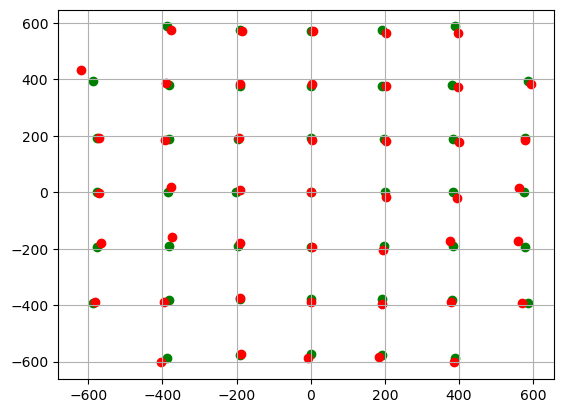

In [28]:
plt.scatter(x_est, y_est, color='green')
plt.scatter(distorted_points[:, 0], distorted_points[:, 1], color='red')
# plt.scatter(undistorted_points[:, 0], undistorted_points[:, 1], color='blue')
plt.grid()

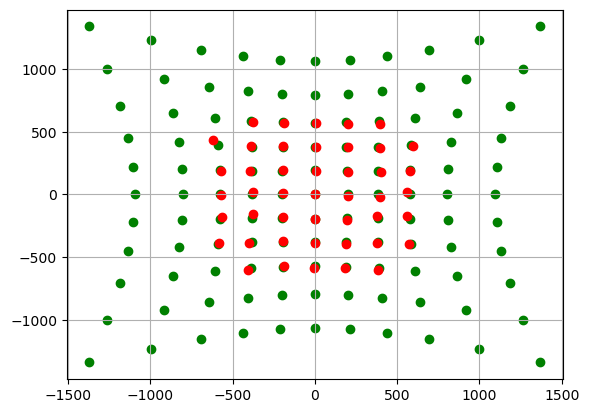

In [31]:
x_axis = [origin[0] - i*x_unit for i in range(-5, 6)]
y_axis = [origin[1] - i*y_unit for i in range(-5, 6)]

xx, yy = np.meshgrid(x_axis, y_axis)
xx, yy = xx[:, ::-1].T, yy.T
undistorted_points = np.zeros([11, 11, 2])
undistorted_points[:, :, 0] = xx
undistorted_points[:, :, 1] = yy
undistorted_points = (undistorted_points - undistorted_points[5, 5]).reshape([-1, 2])

r_ud = np.sqrt((undistorted_points[:, 0])**2  + (undistorted_points[:, 1])**2).reshape(-1)

x_est = undistorted_points[:, 0]*np.sum([kx[i]*r_ud**j for i, j in enumerate(range(0, num_params+1, step))], axis=0) #+ undistorted_points[:, 0]*undistorted_points[:, 1]*kx[-1]*r_ud
y_est = undistorted_points[:, 1]*np.sum([ky[i]*r_ud**j for i, j in enumerate(range(0, num_params+1, step))], axis=0) #+ undistorted_points[:, 0]*undistorted_points[:, 1]*ky[-1]*r_ud
plt.scatter(x_est, y_est, color='green')
plt.scatter(distorted_points[:, 0], distorted_points[:, 1], color='red')
# plt.scatter(undistorted_points[:, 0], undistorted_points[:, 1], color='blue')
plt.grid()

In [32]:
x_axis = [origin[0] - i*x_unit for i in range(-3, 4)]
y_axis = [origin[1] - i*y_unit for i in range(-3, 4)]

xx, yy = np.meshgrid(x_axis, y_axis)
xx, yy = xx[:, ::-1].T, yy.T
undistorted_points = np.zeros([7, 7, 2])
undistorted_points[:, :, 0] = xx
undistorted_points[:, :, 1] = yy
# undistorted_points = (undistorted_points - undistorted_points[5, 5]).reshape([-1, 2])

In [33]:
undistorted_points.shape

(7, 7, 2)

In [34]:
5%2

1

In [35]:
def polynomial_distortion(params, undistorted_points, distortion_type='both'):
    # distortion_type: radial, tangential, both
    # params is a list of polynomial coefficients
    # undistorted_points is a 2D array of undistorted points
    x, y = undistorted_points.T

    if distortion_type == 'radial':
        num_params = len(params)
        if num_params % 2 == 0 and False:
            u = x*(1 + np.sum([params[i] * (x**2+y**2)**(i+1) for i in range(int(num_params/2))], axis=0))
            v = y*(1 + np.sum([params[i + int(num_params/2)] * (x**2+y**2)**(i+1) for i in range(int(num_params/2))], axis=0))
        else:
            u = x*(1 + np.sum([params[i] * (x**2+y**2)**(i+1) for i in range(int(num_params))], axis=0))
            v = y*(1 + np.sum([params[i] * (x**2+y**2)**(i+1) for i in range(int(num_params))], axis=0))
    elif distortion_type == 'tangential':
        u = x + 2*params[0]*x*y + params[1]*(x**2 + y**2 + 2*x**2)
        v = y + params[0]*(x**2 + y**2 + 2*y**2) + 2*params[1]*x*y
    elif distortion_type == 'both':
        u = x*(1 + np.sum([params[i] * (x**2+y**2)**(2*i+1) for i in range(len(params)-2)], axis=0)) 
        v = y*(1 + np.sum([params[i] * (x**2+y**2)**(2*i+1) for i in range(len(params)-2)], axis=0))
        u += 2*params[-2]*x*y + params[-1]*(x**2 + y**2 + 2*x**2)
        v += params[-2]*(x**2 + y**2 + 2*y**2) + 2*params[-1]*x*y
    else:
        return None
    return np.column_stack((u, v))

In [36]:
def optimize(params, distortion_type='both'):
    transformed_points = polynomial_distortion(params, undistorted_points, distortion_type=distortion_type)
    error = np.sum((distorted_points[:] - transformed_points[:])**2)
    return error

In [37]:
x_axis = [origin[0] - i*x_unit for i in range(-3, 4)]
y_axis = [origin[1] - i*y_unit for i in range(-3, 4)]

xx, yy = np.meshgrid(x_axis, y_axis)
xx, yy = xx[:, ::-1].T, yy.T
undistorted_points = np.zeros([7, 7, 2])
undistorted_points[:, :, 0] = xx
undistorted_points[:, :, 1] = yy

undistorted_points = (undistorted_points - undistorted_points[3, 3]).reshape([-1, 2])
distorted_points = (center_cords - center_cords[3, 3]).reshape([-1, 2])

undistorted_points = np.delete(undistorted_points, [0, 6, -7, -1], axis=0)
distorted_points = np.delete(distorted_points, [0, 6, -7, -1], axis=0)

In [38]:
# Initial guess for the polynomial coefficients
TYPE_OF_DISTORTION = 'radial'
PARAMS_LEN = 2
cost = np.inf
opt = []
for i in range(1000):
    initial_guess = (np.random.rand(PARAMS_LEN) - 0.5)*4

    result = minimize(optimize, initial_guess, TYPE_OF_DISTORTION, method='Nelder-Mead')

    # The result will contain the optimized polynomial coefficients
    optimal_params = result.x
    print(f"{i}- Optimal polynomial coefficients:", optimal_params, result.fun)

    if result.fun < cost:
        cost = result.fun
        opt = result.x

print(f'Optimal coeffs: {opt} with Cost: {cost}')

0- Optimal polynomial coefficients: [-1.30216065e-07  2.72579379e-13] 32332.949689449615
1- Optimal polynomial coefficients: [-1.30261768e-07  2.72687848e-13] 32332.94961388214
2- Optimal polynomial coefficients: [-1.30276346e-07  2.72709082e-13] 32332.94963341546
3- Optimal polynomial coefficients: [-1.30244435e-07  2.72651732e-13] 32332.949632767148
4- Optimal polynomial coefficients: [-1.30272680e-07  2.72713061e-13] 32332.949635939603
5- Optimal polynomial coefficients: [-1.30270264e-07  2.72702295e-13] 32332.94961290199
6- Optimal polynomial coefficients: [-1.30261815e-07  2.72689979e-13] 32332.949624629437
7- Optimal polynomial coefficients: [-1.30268418e-07  2.72703544e-13] 32332.94962705919
8- Optimal polynomial coefficients: [-1.30277081e-07  2.72714749e-13] 32332.949629058498
9- Optimal polynomial coefficients: [-1.30249974e-07  2.72646377e-13] 32332.94961322188
10- Optimal polynomial coefficients: [-1.30267797e-07  2.72698823e-13] 32332.949612636254
11- Optimal polynomial co

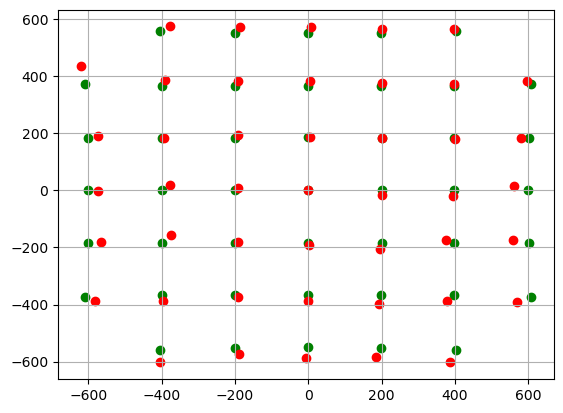

In [39]:
transformed_points = polynomial_distortion(opt, undistorted_points, distortion_type=TYPE_OF_DISTORTION)
plt.scatter(transformed_points[:, 0], transformed_points[:, 1], color='green')
plt.scatter(distorted_points[:, 0], distorted_points[:, 1], color='red')
# plt.scatter(undistorted_points[:, 0], undistorted_points[:, 1], color='black')

plt.grid()

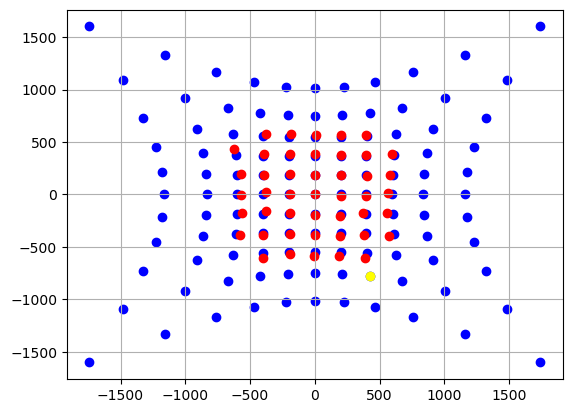

In [40]:
x_axis = [origin[0] - i*x_unit for i in range(-5, 6)]
y_axis = [origin[1] - i*y_unit for i in range(-5, 6)]

xx, yy = np.meshgrid(x_axis, y_axis)
xx, yy = xx[:, ::-1].T, yy.T
center_cords_undis = np.zeros([11, 11, 2])
center_cords_undis[:, :, 0] = xx
center_cords_undis[:, :, 1] = yy
undistorted_points = (center_cords_undis - center_cords_undis[5, 5]).reshape([-1, 2])
transformed_points = polynomial_distortion(opt, undistorted_points, TYPE_OF_DISTORTION)
plt.scatter(transformed_points[:, 0], transformed_points[:, 1], color='blue')

plt.scatter(distorted_points[:, 0], distorted_points[:, 1], color='red')
# plt.scatter(undistorted_points[:, 0], undistorted_points[:, 1], color='black')


plt.scatter(transformed_points.reshape([11, 11, 2])[7, 9, 0], transformed_points.reshape([11, 11, 2])[7, 9, 1], color='yellow')
plt.grid()

In [323]:
## ellipse center based on extrapolation above

x: 16 y: 19 2023_03_15_16_02_07_img_shutter_05_x_16_y_19_r_0_g_1_b_0.tiff


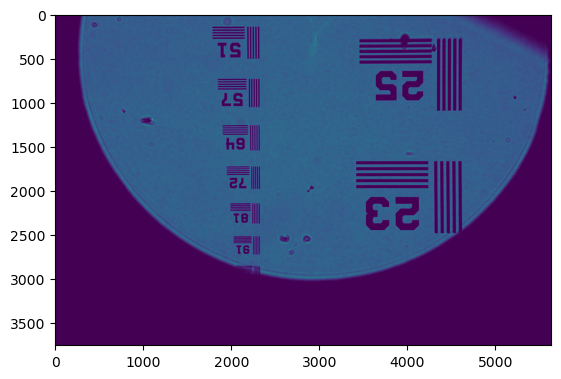

In [349]:
x,y = 16, 19

dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"
print('x:', x, 'y:', y, file_path)

img = cv2.imread(dir_path + file_path, cv2.IMREAD_UNCHANGED)
_, g_img, _ = cv2.split(img)

img_8 = cv2.convertScaleAbs(img, alpha=(255/65535))
g_img_8 = cv2.convertScaleAbs(g_img, alpha=(255/65535))

center, axis_size, f = fit_ellipse_3(file_path, img_8, g_img_8, ifHull=True, method='opencv', save_path=None)

# if center is not None:

#     good_fit = input("Is it a good fit?")
#     fit_range[x-12, y-12] = int(good_fit)
#     center_cords[x-12, y-12] = center
#     axis_lens[x-12, y-12] = axis_size


plt.imshow(g_img_8)

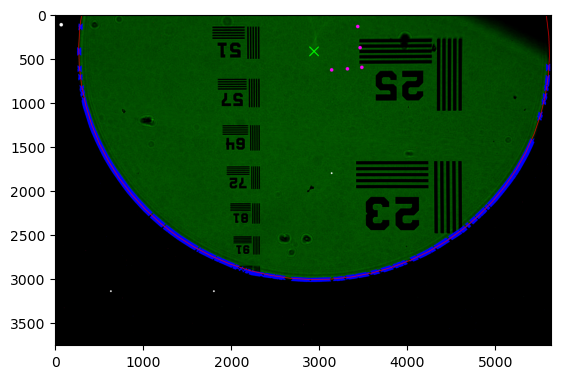

In [370]:
cv2.circle(img_8, np.array(transformed_points.reshape([11, 11, 2])[9, 10] + center_cords_undis[5, 5], dtype=np.uint16), 
           20, (255, 0, 255), -1)

plt.imshow(img_8)

In [354]:
int(transformed_points.reshape([11, 11, 2])[7, 8, 0]) + center_cords_undis[5, 5][0], int(transformed_points.reshape([11, 11, 2])[7, 8, 1]) + center_cords_undis[5, 5][1]

(3142.0, 634.0)

x: 10 y: 10 2023_03_15_16_02_07_img_shutter_05_x_10_y_10_r_0_g_1_b_0.tiff


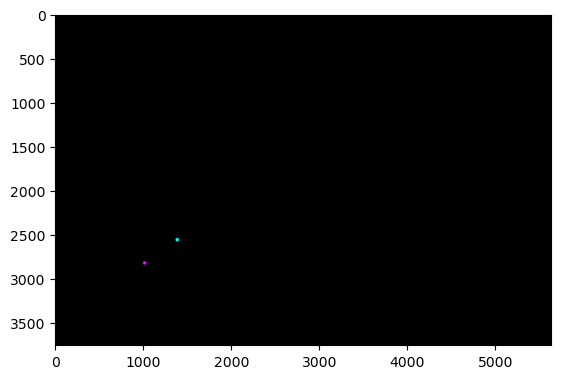

x: 10 y: 11 2023_03_15_16_02_07_img_shutter_05_x_10_y_11_r_0_g_1_b_0.tiff


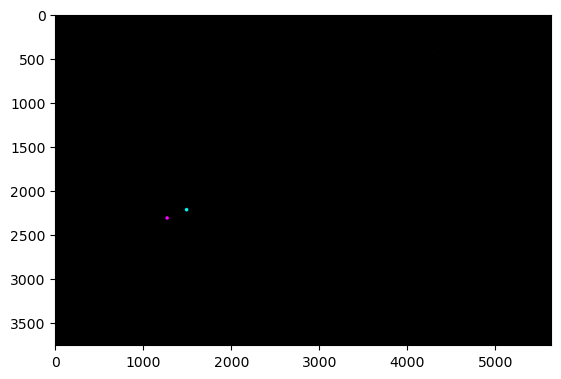

x: 10 y: 12 2023_03_15_16_02_07_img_shutter_05_x_10_y_12_r_0_g_1_b_0.tiff


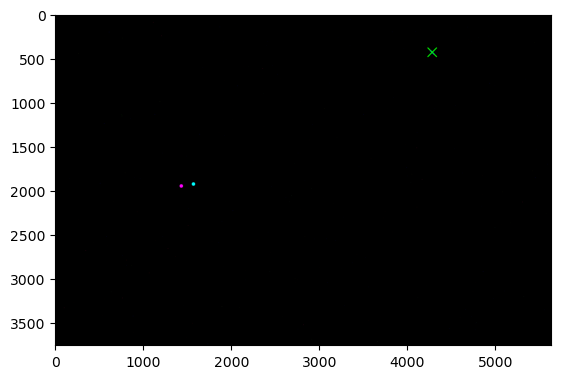

x: 10 y: 13 2023_03_15_16_02_07_img_shutter_05_x_10_y_13_r_0_g_1_b_0.tiff


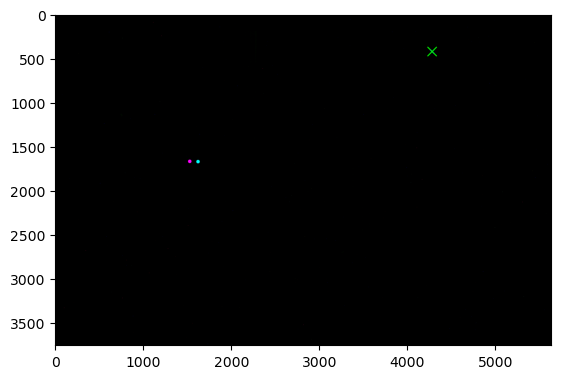

x: 10 y: 14 2023_03_15_16_02_07_img_shutter_05_x_10_y_14_r_0_g_1_b_0.tiff


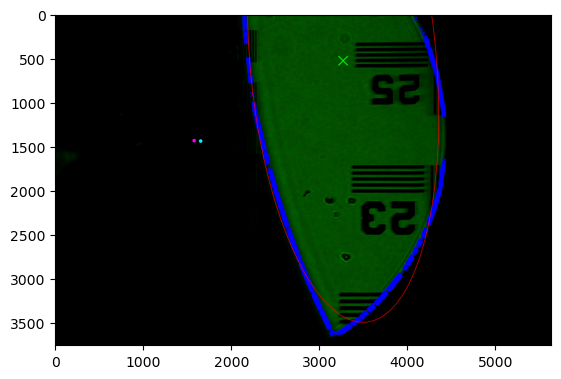

x: 10 y: 15 2023_03_15_16_02_07_img_shutter_05_x_10_y_15_r_0_g_1_b_0.tiff


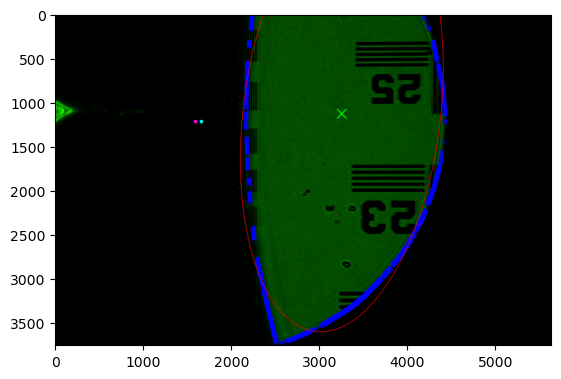

x: 10 y: 16 2023_03_15_16_02_07_img_shutter_05_x_10_y_16_r_0_g_1_b_0.tiff


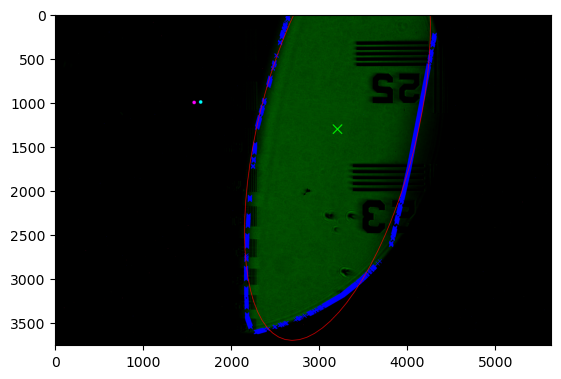

x: 10 y: 17 2023_03_15_16_02_07_img_shutter_05_x_10_y_17_r_0_g_1_b_0.tiff


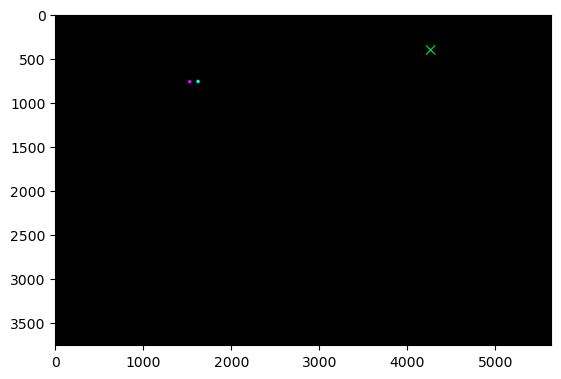

x: 10 y: 18 2023_03_15_16_02_07_img_shutter_05_x_10_y_18_r_0_g_1_b_0.tiff


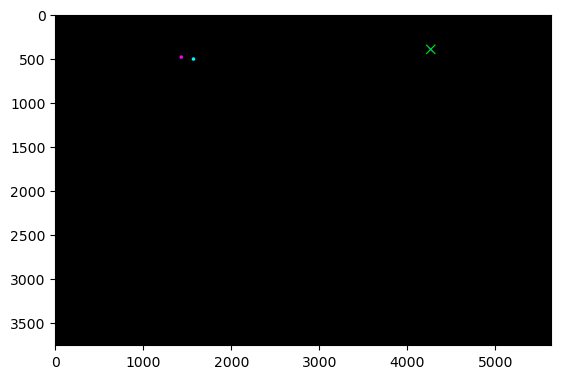

x: 10 y: 19 2023_03_15_16_02_07_img_shutter_05_x_10_y_19_r_0_g_1_b_0.tiff


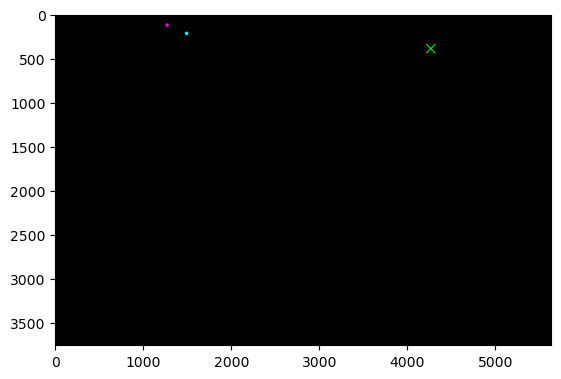

x: 10 y: 20 2023_03_15_16_02_07_img_shutter_05_x_10_y_20_r_0_g_1_b_0.tiff


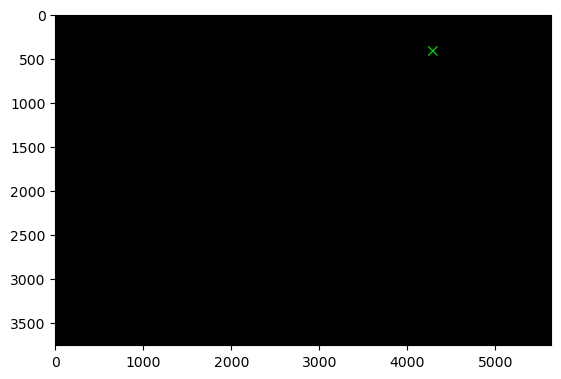

x: 11 y: 10 2023_03_15_16_02_07_img_shutter_05_x_11_y_10_r_0_g_1_b_0.tiff


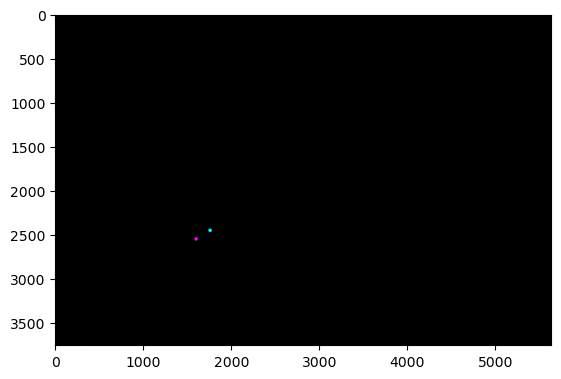

x: 11 y: 11 2023_03_15_16_02_07_img_shutter_05_x_11_y_11_r_0_g_1_b_0.tiff


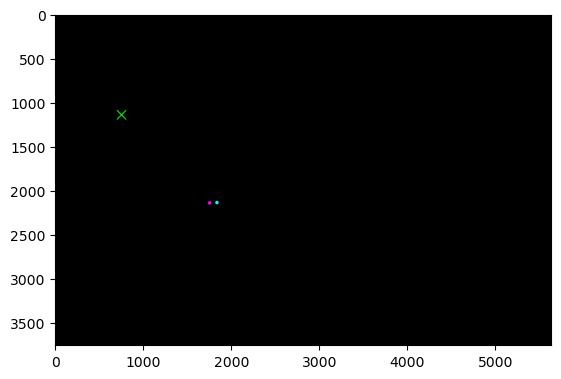

x: 11 y: 12 2023_03_15_16_02_07_img_shutter_05_x_11_y_12_r_0_g_1_b_0.tiff


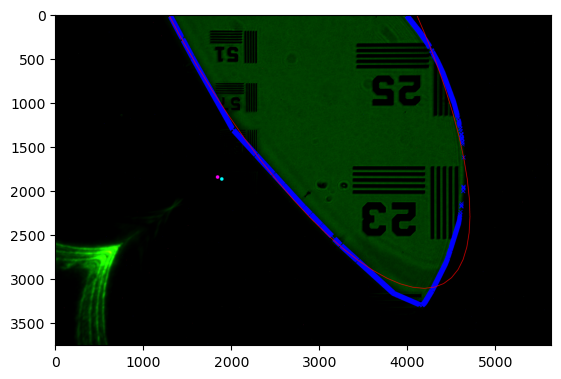

x: 11 y: 13 2023_03_15_16_02_07_img_shutter_05_x_11_y_13_r_0_g_1_b_0.tiff


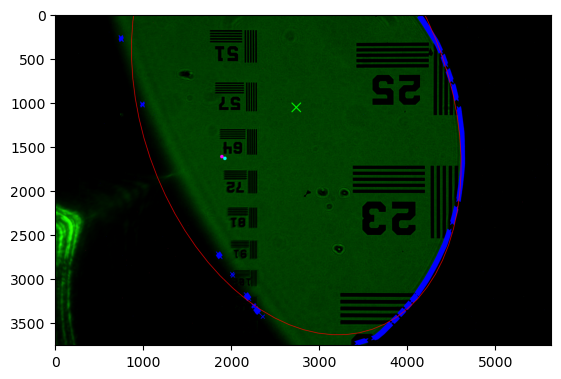

x: 11 y: 14 2023_03_15_16_02_07_img_shutter_05_x_11_y_14_r_0_g_1_b_0.tiff


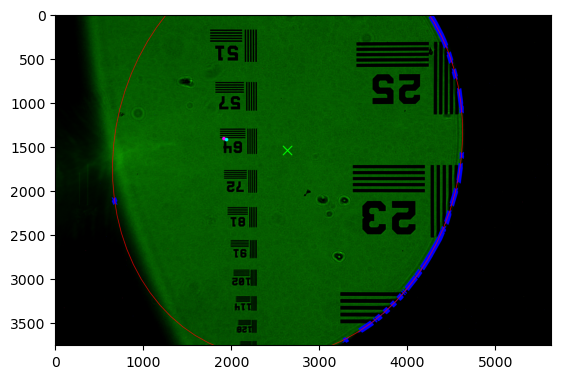

x: 11 y: 15 2023_03_15_16_02_07_img_shutter_05_x_11_y_15_r_0_g_1_b_0.tiff


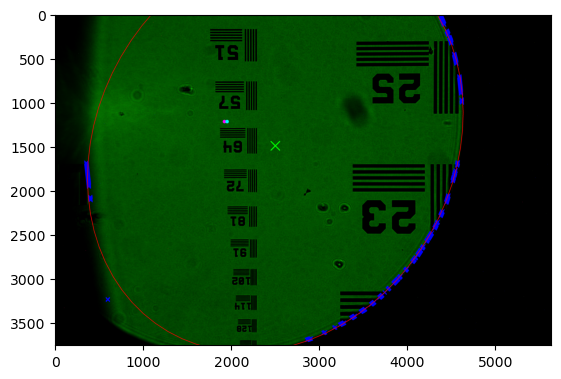

x: 11 y: 16 2023_03_15_16_02_07_img_shutter_05_x_11_y_16_r_0_g_1_b_0.tiff


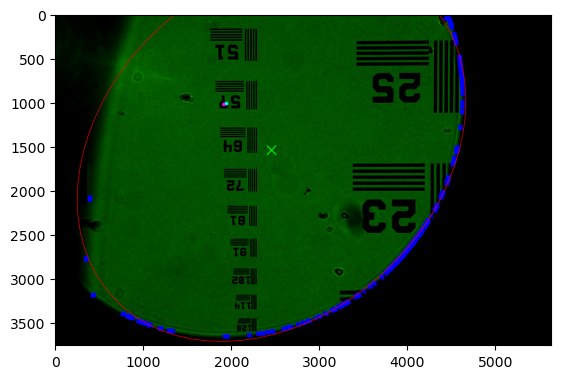

x: 11 y: 17 2023_03_15_16_02_07_img_shutter_05_x_11_y_17_r_0_g_1_b_0.tiff


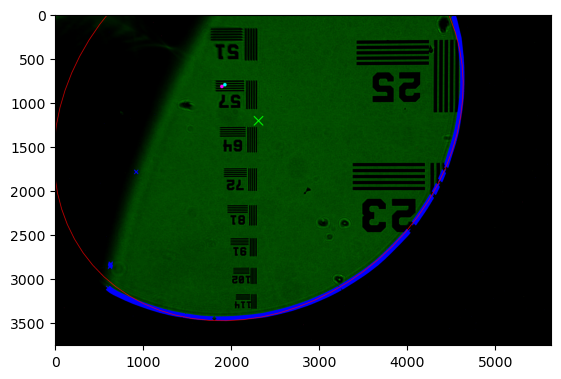

x: 11 y: 18 2023_03_15_16_02_07_img_shutter_05_x_11_y_18_r_0_g_1_b_0.tiff


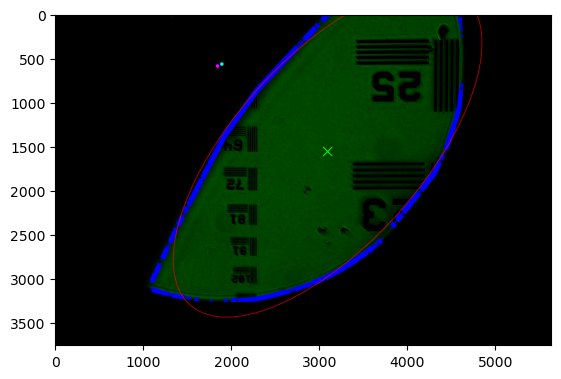

x: 11 y: 19 2023_03_15_16_02_07_img_shutter_05_x_11_y_19_r_0_g_1_b_0.tiff


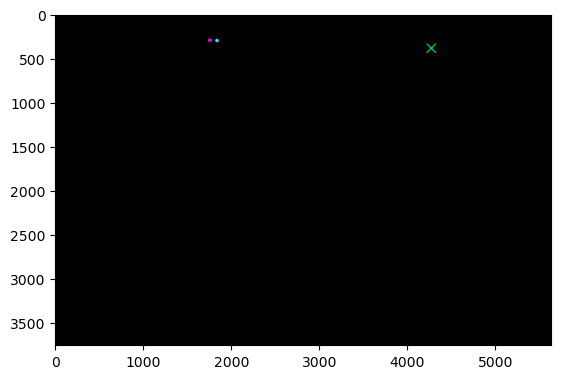

x: 11 y: 20 2023_03_15_16_02_07_img_shutter_05_x_11_y_20_r_0_g_1_b_0.tiff


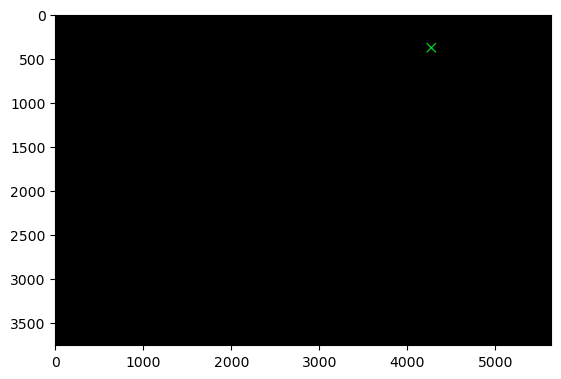

x: 12 y: 10 2023_03_15_16_02_07_img_shutter_05_x_12_y_10_r_0_g_1_b_0.tiff


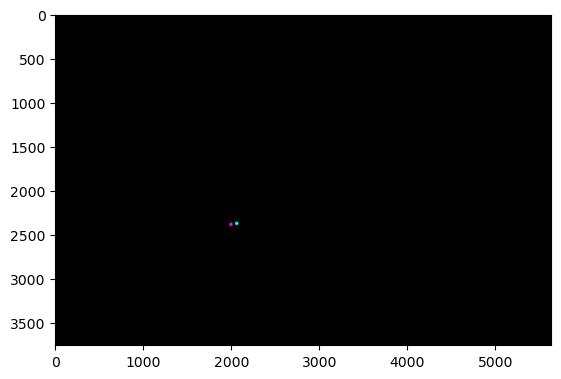

x: 12 y: 11 2023_03_15_16_02_07_img_shutter_05_x_12_y_11_r_0_g_1_b_0.tiff


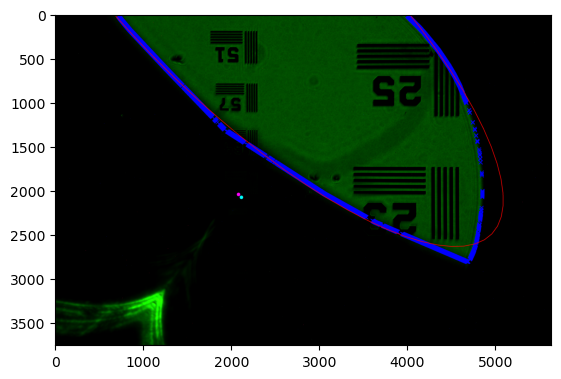

x: 12 y: 12 2023_03_15_16_02_07_img_shutter_05_x_12_y_12_r_0_g_1_b_0.tiff


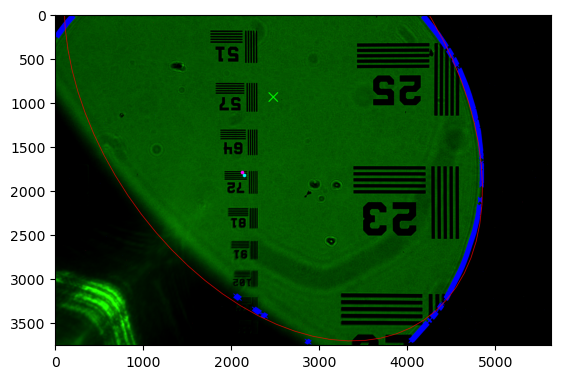

x: 12 y: 13 2023_03_15_16_02_07_img_shutter_05_x_12_y_13_r_0_g_1_b_0.tiff


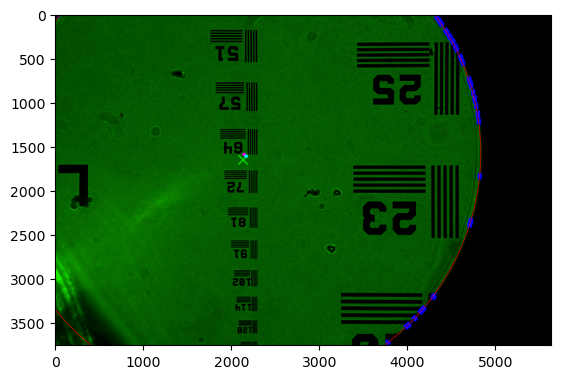

x: 12 y: 14 2023_03_15_16_02_07_img_shutter_05_x_12_y_14_r_0_g_1_b_0.tiff


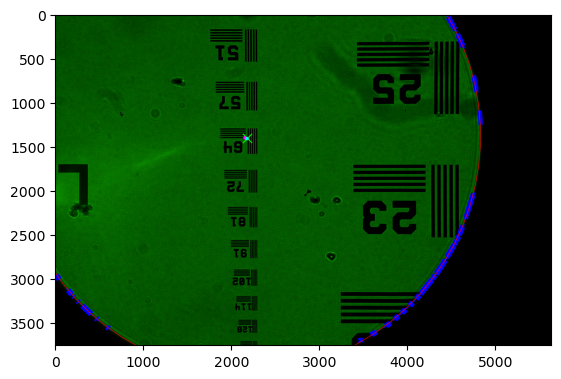

x: 12 y: 15 2023_03_15_16_02_07_img_shutter_05_x_12_y_15_r_0_g_1_b_0.tiff


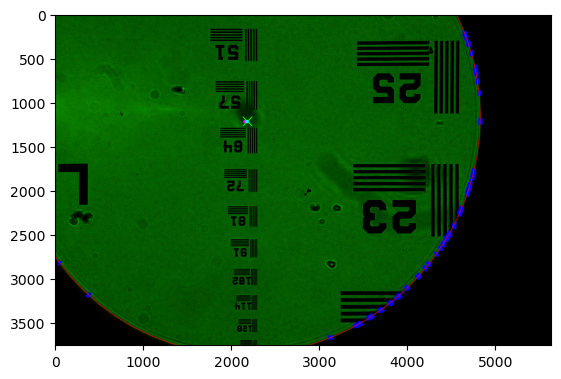

x: 12 y: 16 2023_03_15_16_02_07_img_shutter_05_x_12_y_16_r_0_g_1_b_0.tiff


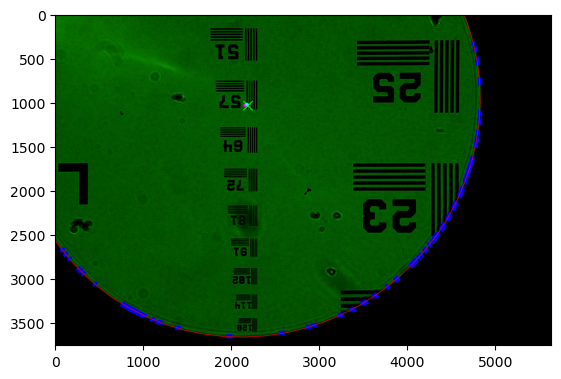

x: 12 y: 17 2023_03_15_16_02_07_img_shutter_05_x_12_y_17_r_0_g_1_b_0.tiff


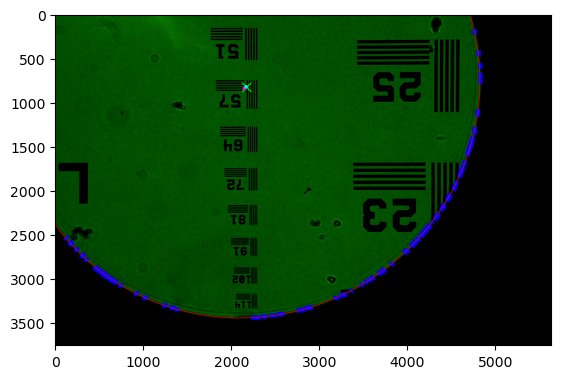

x: 12 y: 18 2023_03_15_16_02_07_img_shutter_05_x_12_y_18_r_0_g_1_b_0.tiff


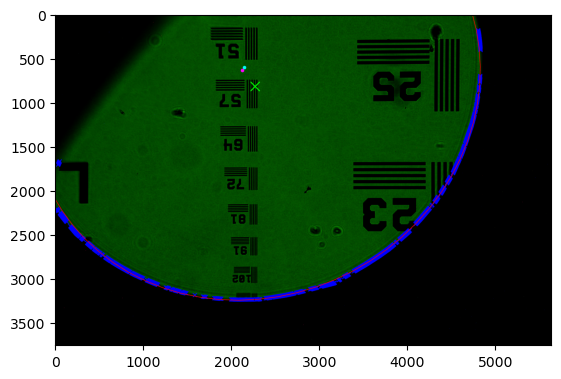

x: 12 y: 19 2023_03_15_16_02_07_img_shutter_05_x_12_y_19_r_0_g_1_b_0.tiff


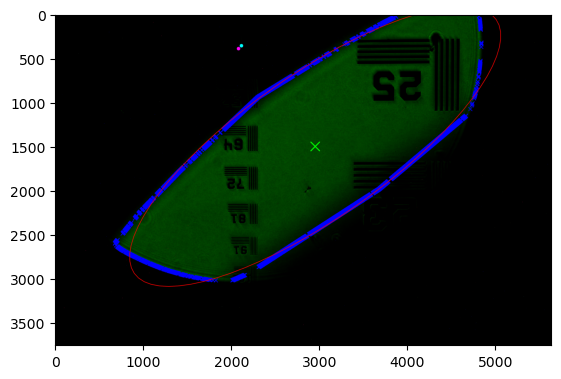

x: 12 y: 20 2023_03_15_16_02_07_img_shutter_05_x_12_y_20_r_0_g_1_b_0.tiff


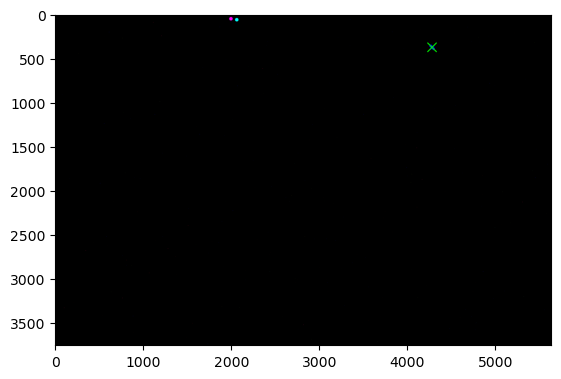

x: 13 y: 10 2023_03_15_16_02_07_img_shutter_05_x_13_y_10_r_0_g_1_b_0.tiff


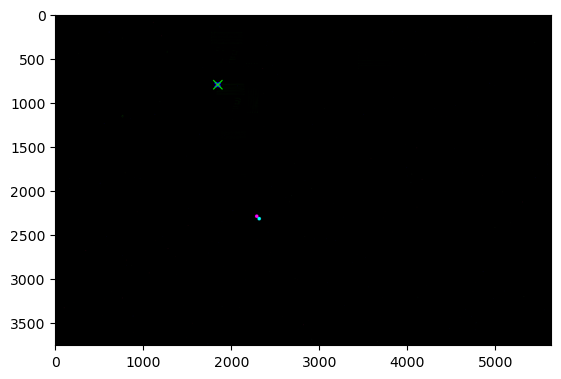

x: 13 y: 11 2023_03_15_16_02_07_img_shutter_05_x_13_y_11_r_0_g_1_b_0.tiff


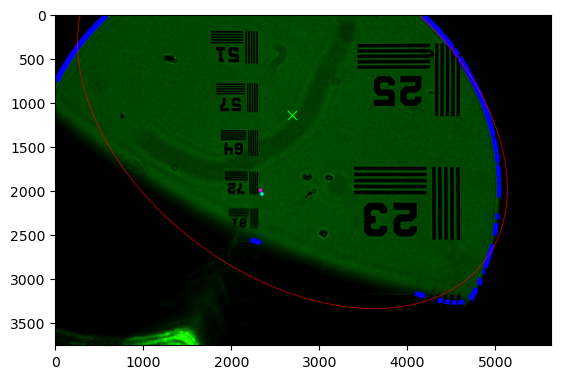

x: 13 y: 12 2023_03_15_16_02_07_img_shutter_05_x_13_y_12_r_0_g_1_b_0.tiff


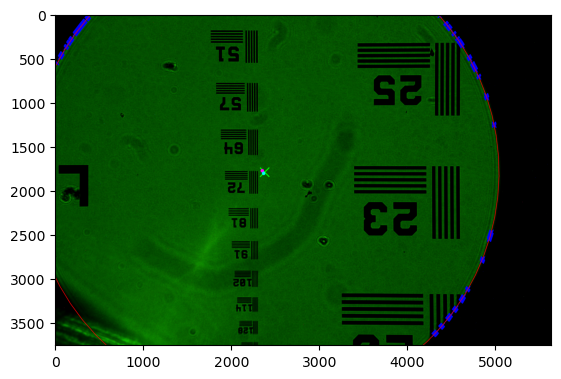

x: 13 y: 13 2023_03_15_16_02_07_img_shutter_05_x_13_y_13_r_0_g_1_b_0.tiff


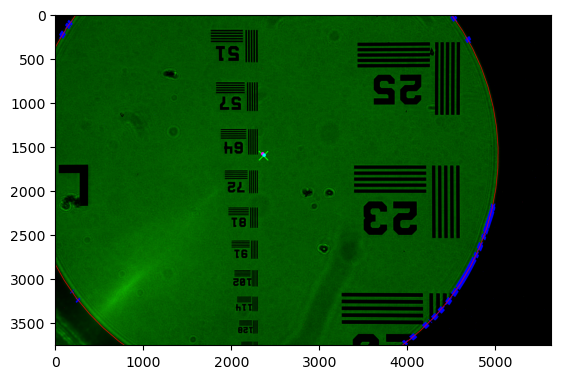

x: 13 y: 14 2023_03_15_16_02_07_img_shutter_05_x_13_y_14_r_0_g_1_b_0.tiff


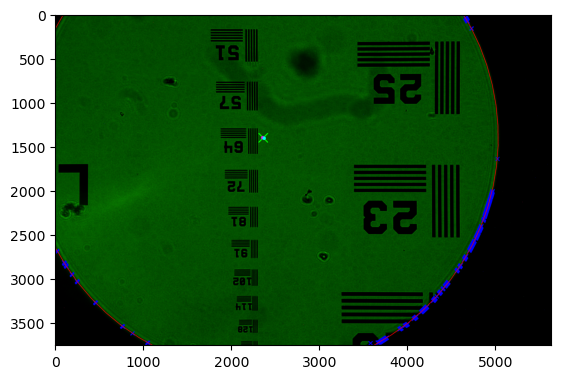

x: 13 y: 15 2023_03_15_16_02_07_img_shutter_05_x_13_y_15_r_0_g_1_b_0.tiff


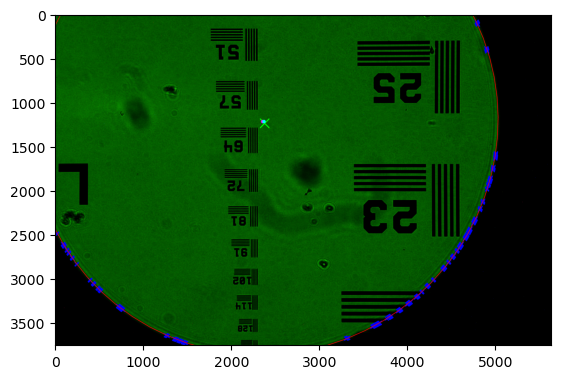

x: 13 y: 16 2023_03_15_16_02_07_img_shutter_05_x_13_y_16_r_0_g_1_b_0.tiff


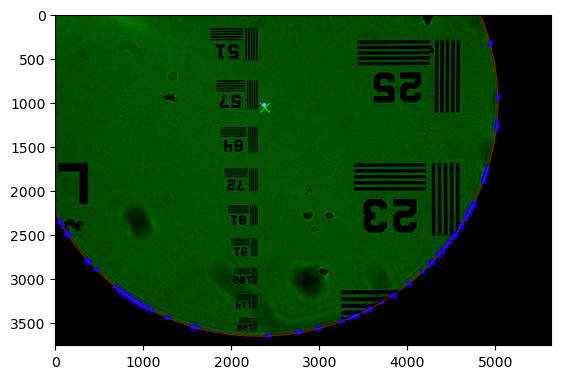

x: 13 y: 17 2023_03_15_16_02_07_img_shutter_05_x_13_y_17_r_0_g_1_b_0.tiff


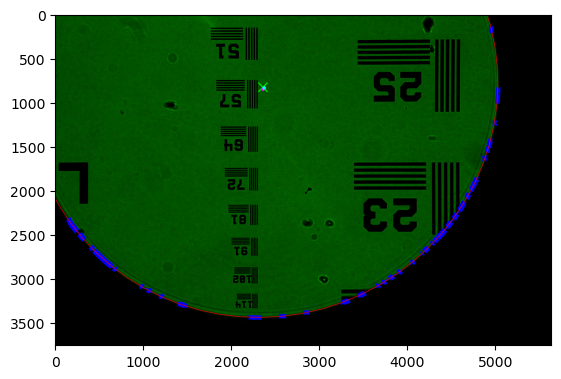

x: 13 y: 18 2023_03_15_16_02_07_img_shutter_05_x_13_y_18_r_0_g_1_b_0.tiff


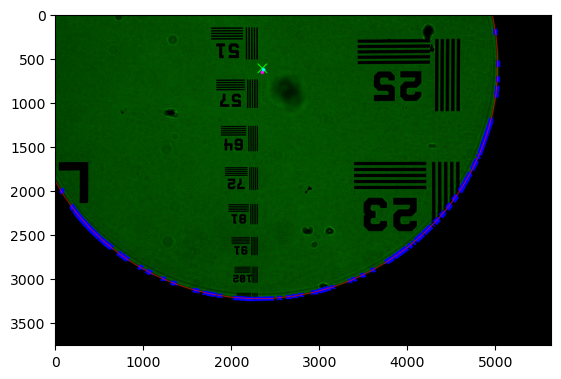

x: 13 y: 19 2023_03_15_16_02_07_img_shutter_05_x_13_y_19_r_0_g_1_b_0.tiff


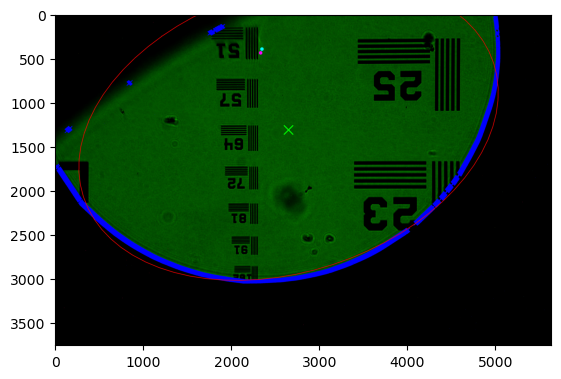

x: 13 y: 20 2023_03_15_16_02_07_img_shutter_05_x_13_y_20_r_0_g_1_b_0.tiff


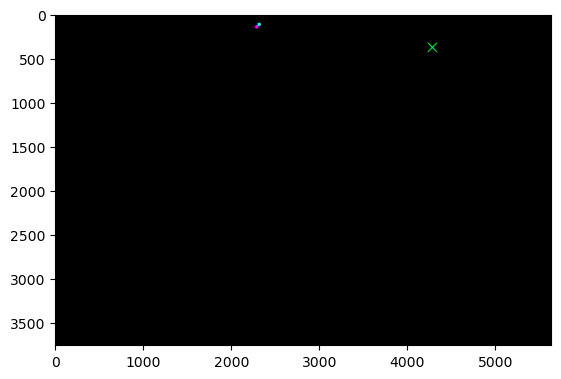

x: 14 y: 10 2023_03_15_16_02_07_img_shutter_05_x_14_y_10_r_0_g_1_b_0.tiff


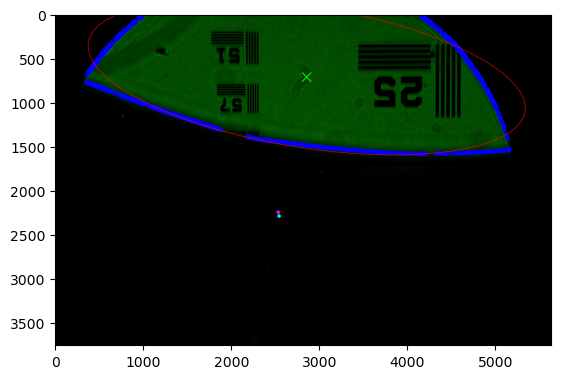

x: 14 y: 11 2023_03_15_16_02_07_img_shutter_05_x_14_y_11_r_0_g_1_b_0.tiff


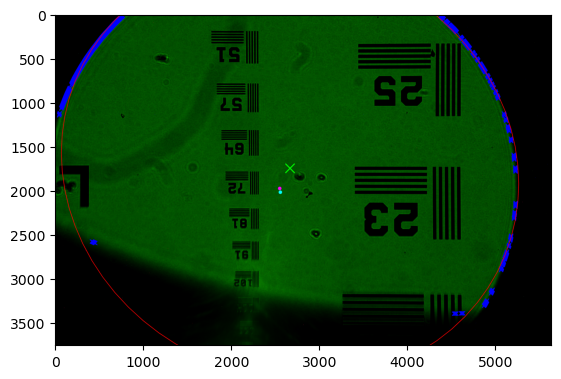

x: 14 y: 12 2023_03_15_16_02_07_img_shutter_05_x_14_y_12_r_0_g_1_b_0.tiff


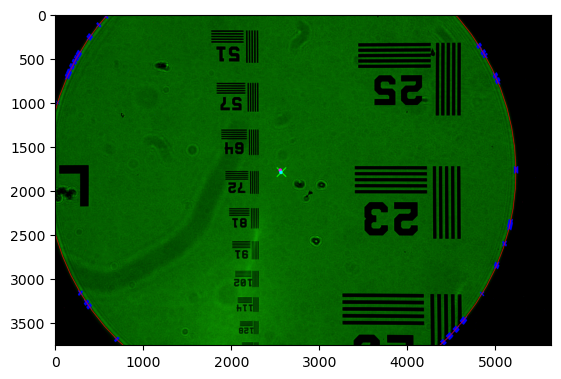

x: 14 y: 13 2023_03_15_16_02_07_img_shutter_05_x_14_y_13_r_0_g_1_b_0.tiff


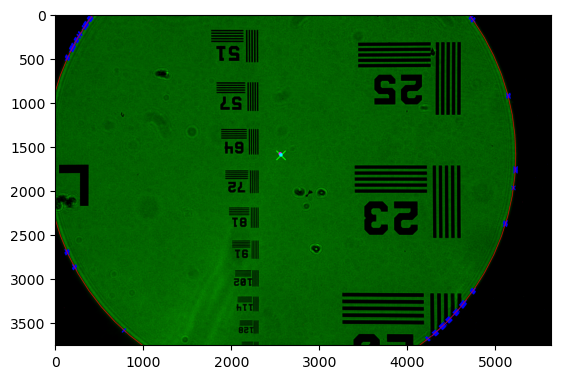

x: 14 y: 14 2023_03_15_16_02_07_img_shutter_05_x_14_y_14_r_0_g_1_b_0.tiff


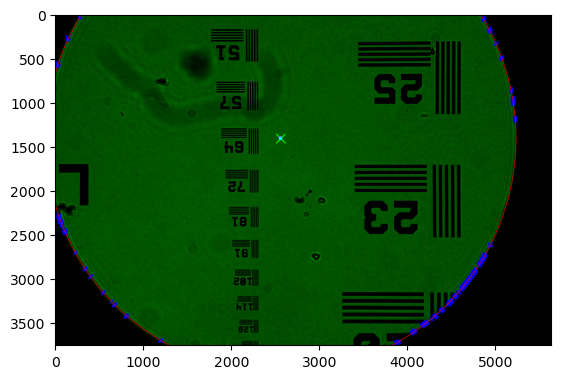

x: 14 y: 15 2023_03_15_16_02_07_img_shutter_05_x_14_y_15_r_0_g_1_b_0.tiff


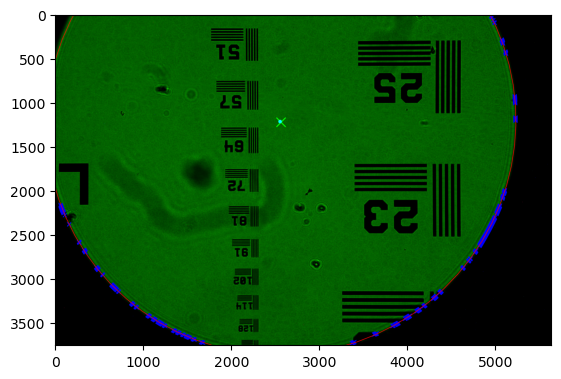

x: 14 y: 16 2023_03_15_16_02_07_img_shutter_05_x_14_y_16_r_0_g_1_b_0.tiff


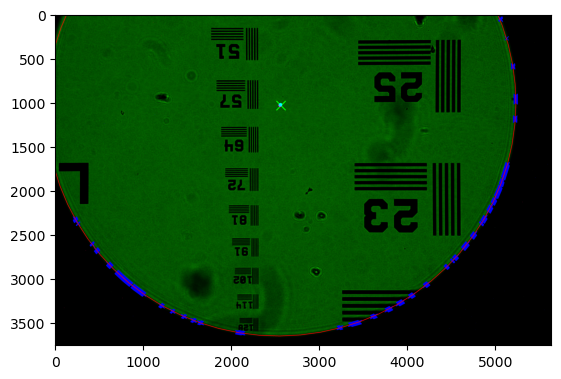

x: 14 y: 17 2023_03_15_16_02_07_img_shutter_05_x_14_y_17_r_0_g_1_b_0.tiff


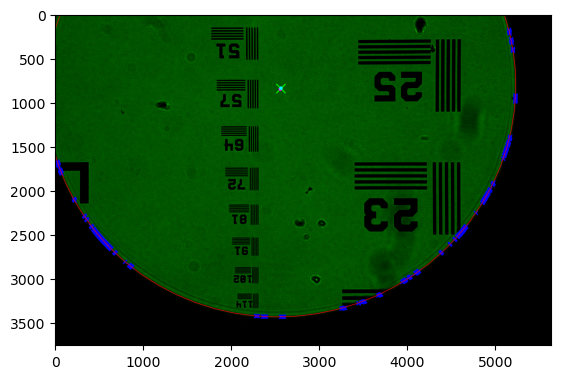

x: 14 y: 18 2023_03_15_16_02_07_img_shutter_05_x_14_y_18_r_0_g_1_b_0.tiff


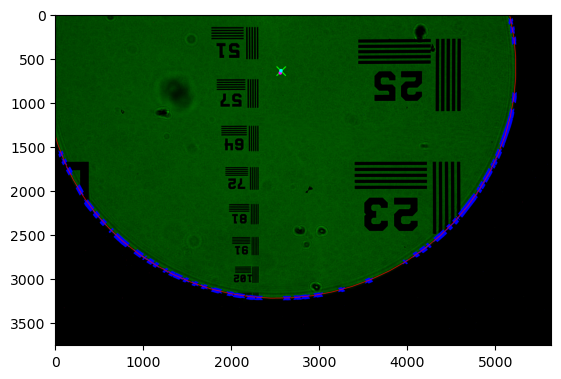

x: 14 y: 19 2023_03_15_16_02_07_img_shutter_05_x_14_y_19_r_0_g_1_b_0.tiff


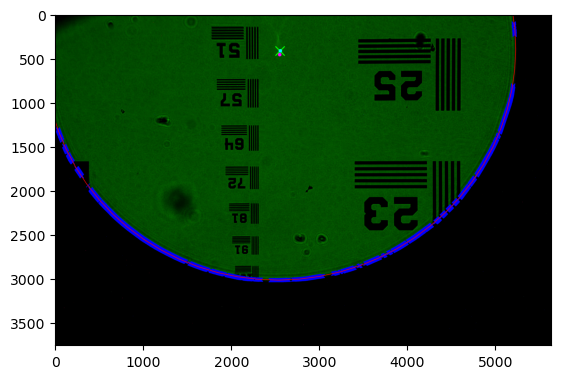

x: 14 y: 20 2023_03_15_16_02_07_img_shutter_05_x_14_y_20_r_0_g_1_b_0.tiff


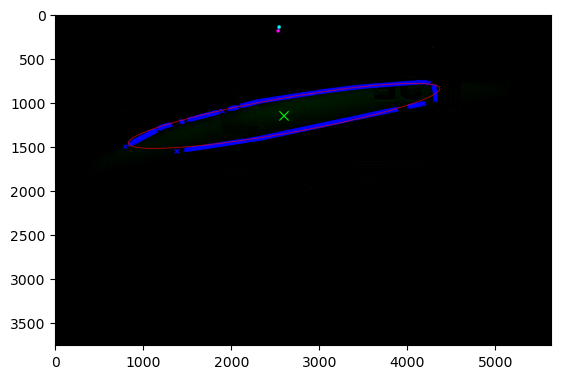

x: 15 y: 10 2023_03_15_16_02_07_img_shutter_05_x_15_y_10_r_0_g_1_b_0.tiff


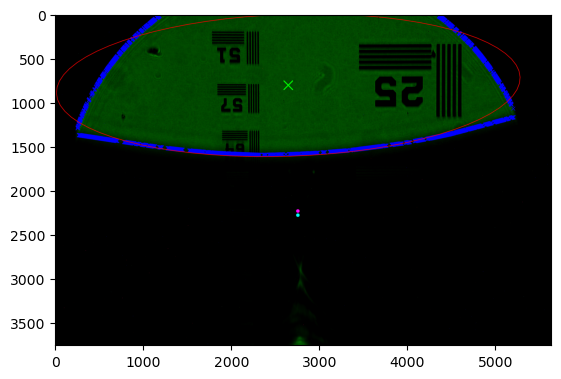

x: 15 y: 11 2023_03_15_16_02_07_img_shutter_05_x_15_y_11_r_0_g_1_b_0.tiff


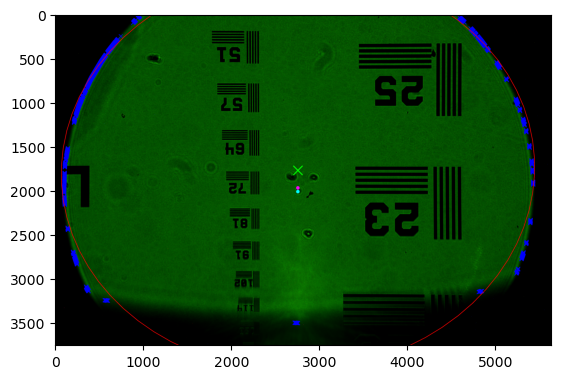

x: 15 y: 12 2023_03_15_16_02_07_img_shutter_05_x_15_y_12_r_0_g_1_b_0.tiff


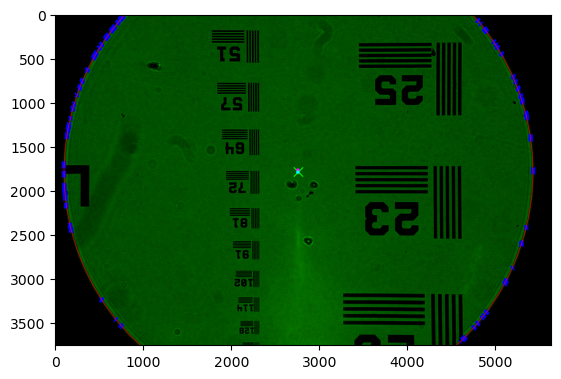

x: 15 y: 13 2023_03_15_16_02_07_img_shutter_05_x_15_y_13_r_0_g_1_b_0.tiff


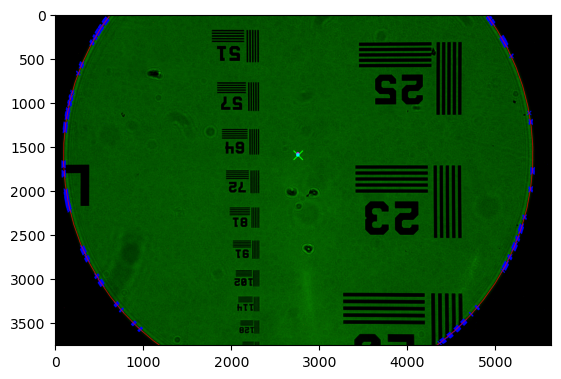

x: 15 y: 14 2023_03_15_16_02_07_img_shutter_05_x_15_y_14_r_0_g_1_b_0.tiff


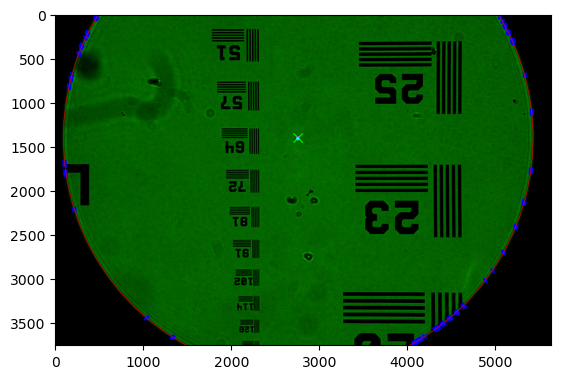

x: 15 y: 15 2023_03_15_16_02_07_img_shutter_05_x_15_y_15_r_0_g_1_b_0.tiff


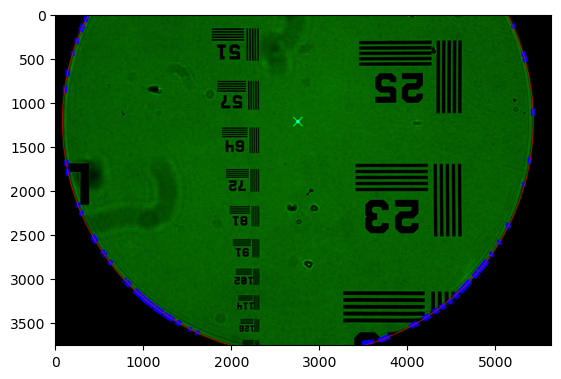

x: 15 y: 16 2023_03_15_16_02_07_img_shutter_05_x_15_y_16_r_0_g_1_b_0.tiff


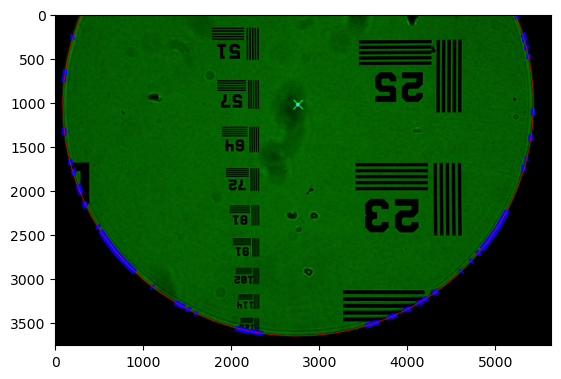

x: 15 y: 17 2023_03_15_16_02_07_img_shutter_05_x_15_y_17_r_0_g_1_b_0.tiff


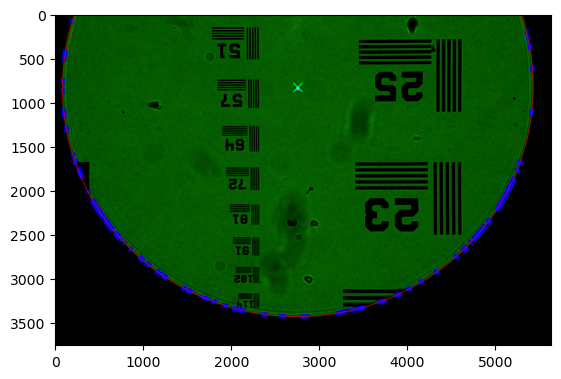

x: 15 y: 18 2023_03_15_16_02_07_img_shutter_05_x_15_y_18_r_0_g_1_b_0.tiff


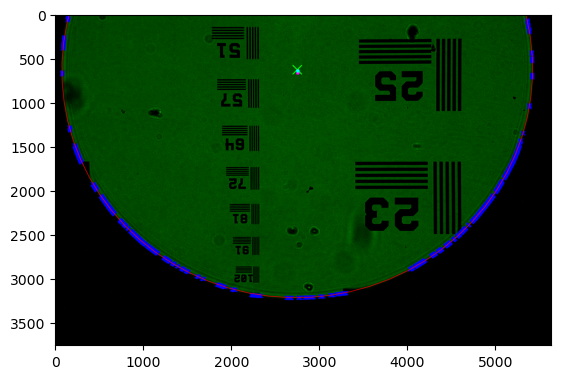

x: 15 y: 19 2023_03_15_16_02_07_img_shutter_05_x_15_y_19_r_0_g_1_b_0.tiff


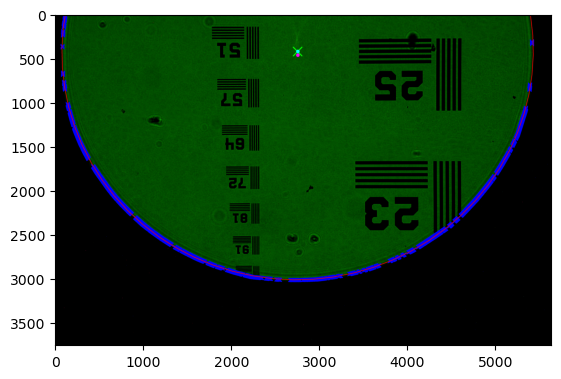

x: 15 y: 20 2023_03_15_16_02_07_img_shutter_05_x_15_y_20_r_0_g_1_b_0.tiff


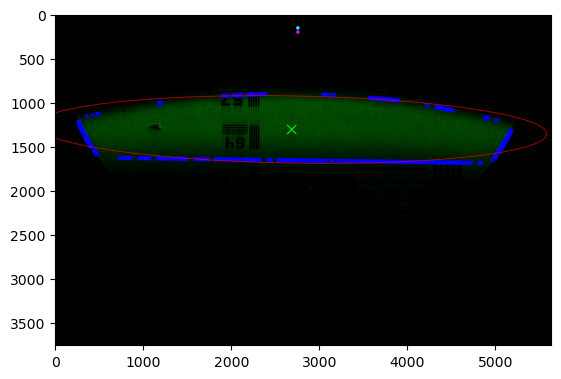

x: 16 y: 10 2023_03_15_16_02_07_img_shutter_05_x_16_y_10_r_0_g_1_b_0.tiff


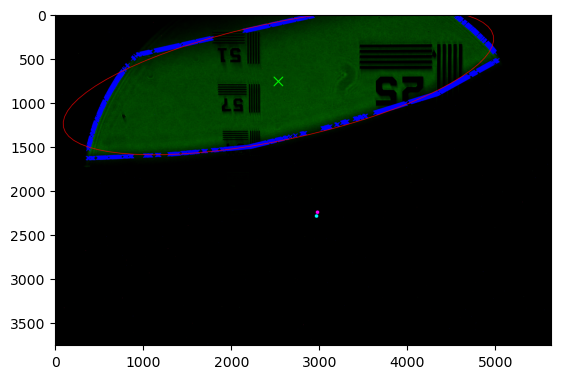

x: 16 y: 11 2023_03_15_16_02_07_img_shutter_05_x_16_y_11_r_0_g_1_b_0.tiff


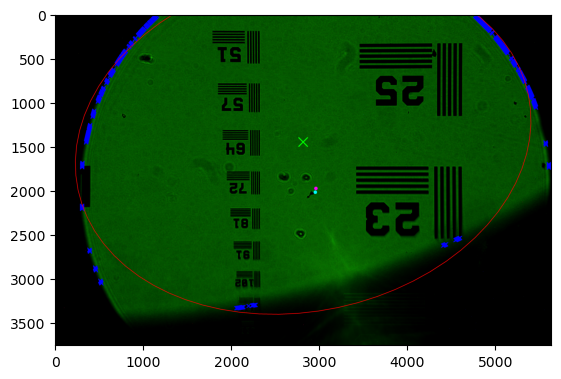

x: 16 y: 12 2023_03_15_16_02_07_img_shutter_05_x_16_y_12_r_0_g_1_b_0.tiff


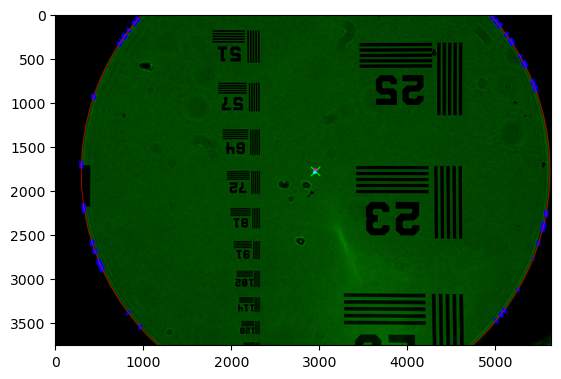

x: 16 y: 13 2023_03_15_16_02_07_img_shutter_05_x_16_y_13_r_0_g_1_b_0.tiff


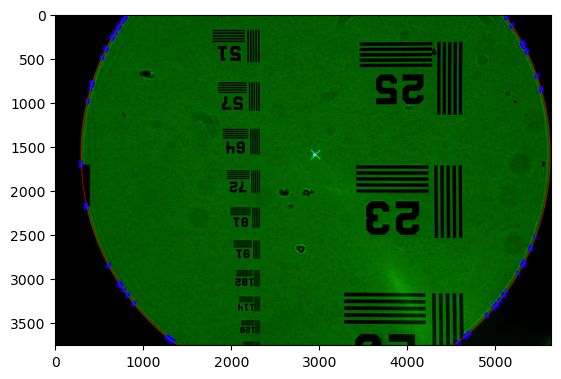

x: 16 y: 14 2023_03_15_16_02_07_img_shutter_05_x_16_y_14_r_0_g_1_b_0.tiff


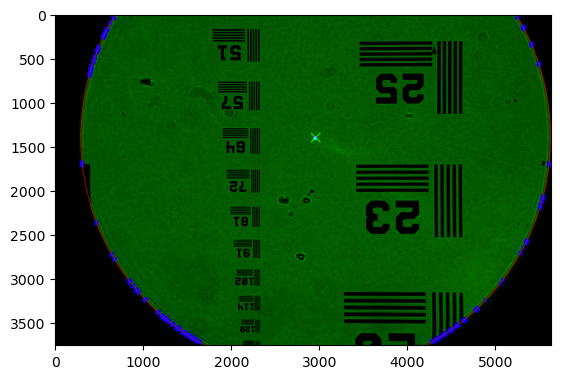

x: 16 y: 15 2023_03_15_16_02_07_img_shutter_05_x_16_y_15_r_0_g_1_b_0.tiff


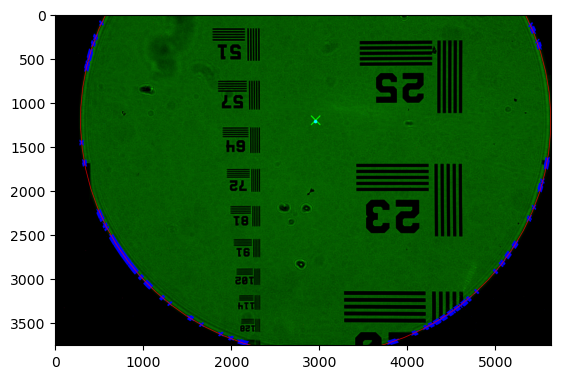

x: 16 y: 16 2023_03_15_16_02_07_img_shutter_05_x_16_y_16_r_0_g_1_b_0.tiff


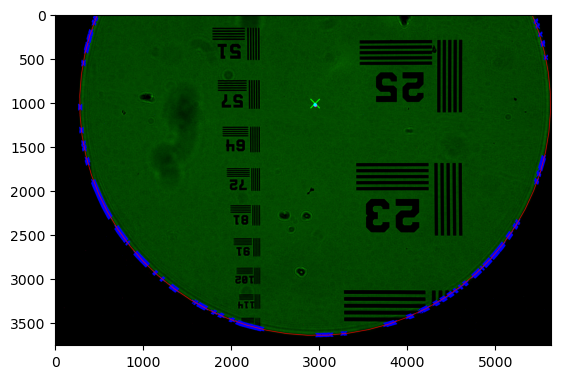

x: 16 y: 17 2023_03_15_16_02_07_img_shutter_05_x_16_y_17_r_0_g_1_b_0.tiff


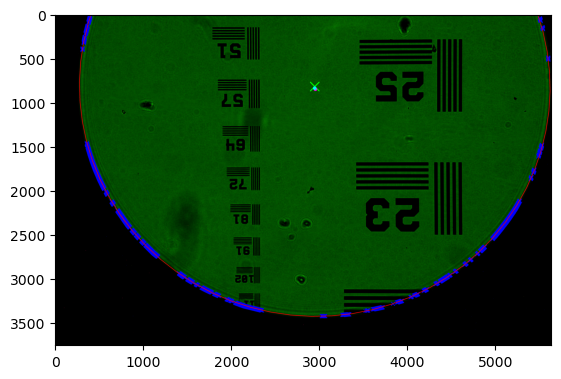

x: 16 y: 18 2023_03_15_16_02_07_img_shutter_05_x_16_y_18_r_0_g_1_b_0.tiff


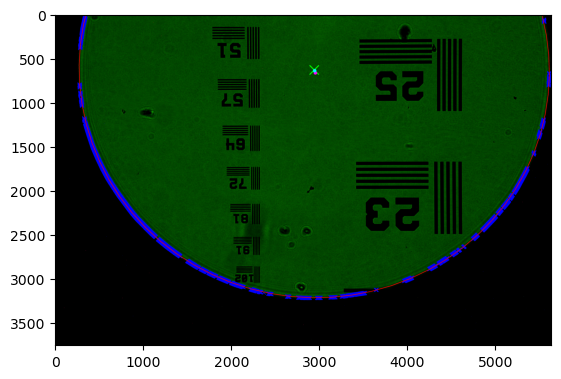

x: 16 y: 19 2023_03_15_16_02_07_img_shutter_05_x_16_y_19_r_0_g_1_b_0.tiff


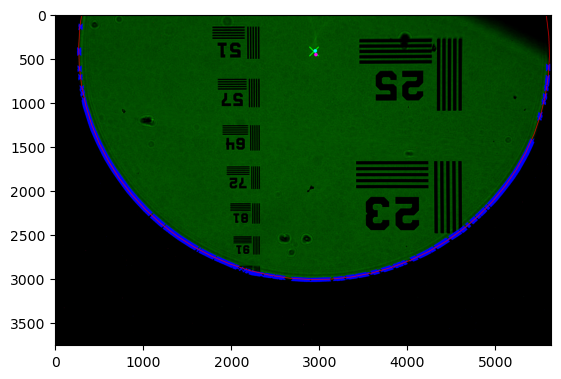

x: 16 y: 20 2023_03_15_16_02_07_img_shutter_05_x_16_y_20_r_0_g_1_b_0.tiff


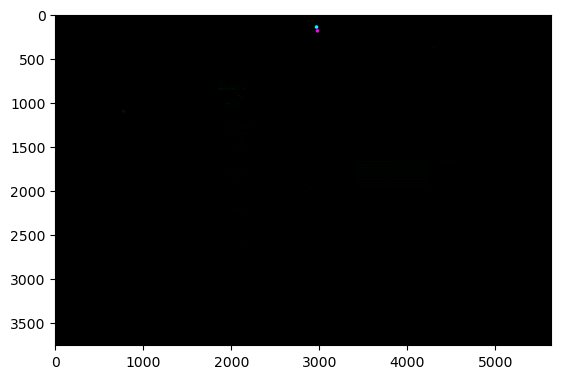

x: 17 y: 10 2023_03_15_16_02_07_img_shutter_05_x_17_y_10_r_0_g_1_b_0.tiff


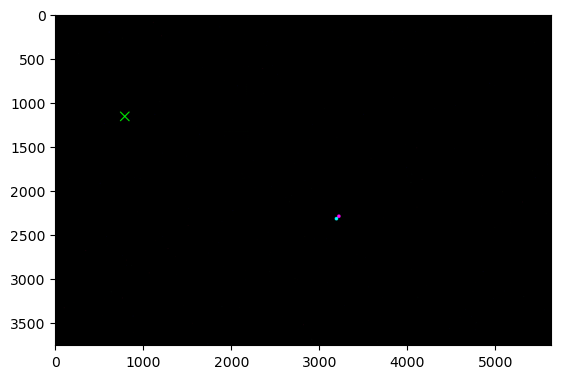

x: 17 y: 11 2023_03_15_16_02_07_img_shutter_05_x_17_y_11_r_0_g_1_b_0.tiff


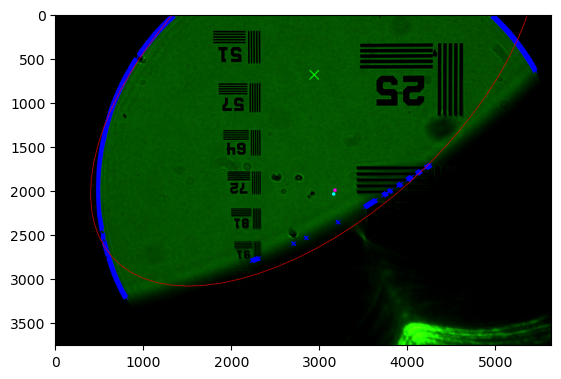

x: 17 y: 12 2023_03_15_16_02_07_img_shutter_05_x_17_y_12_r_0_g_1_b_0.tiff


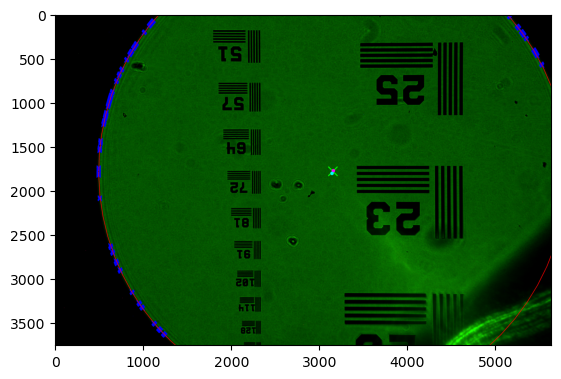

x: 17 y: 13 2023_03_15_16_02_07_img_shutter_05_x_17_y_13_r_0_g_1_b_0.tiff


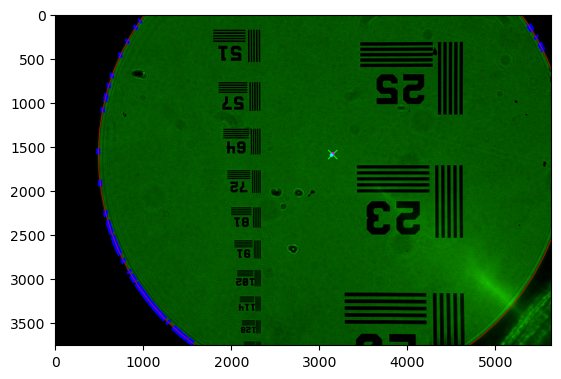

x: 17 y: 14 2023_03_15_16_02_07_img_shutter_05_x_17_y_14_r_0_g_1_b_0.tiff


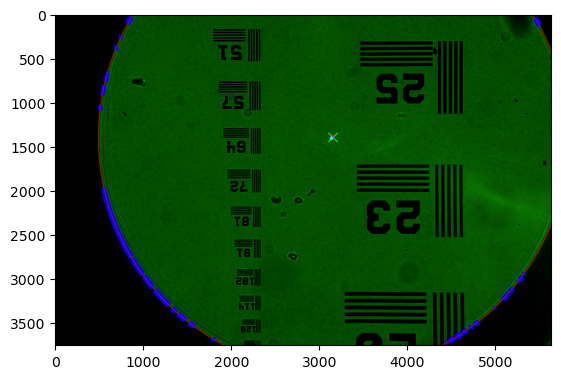

x: 17 y: 15 2023_03_15_16_02_07_img_shutter_05_x_17_y_15_r_0_g_1_b_0.tiff


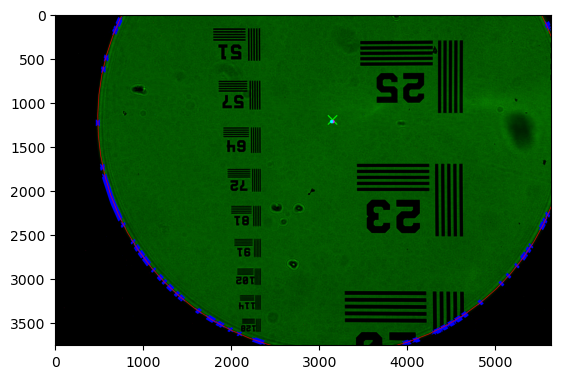

x: 17 y: 16 2023_03_15_16_02_07_img_shutter_05_x_17_y_16_r_0_g_1_b_0.tiff


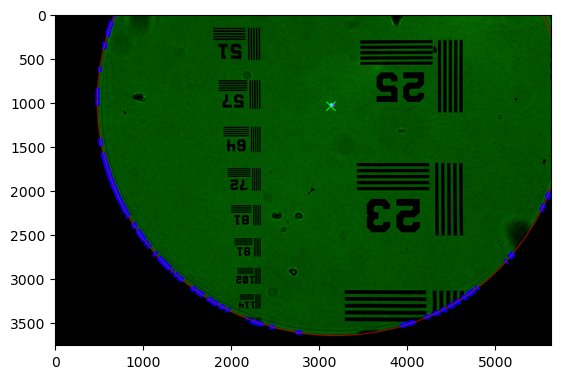

x: 17 y: 17 2023_03_15_16_02_07_img_shutter_05_x_17_y_17_r_0_g_1_b_0.tiff


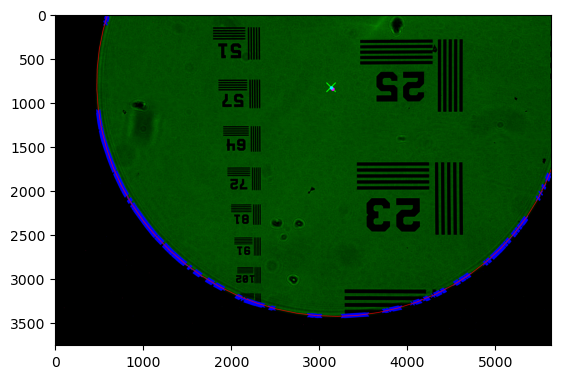

x: 17 y: 18 2023_03_15_16_02_07_img_shutter_05_x_17_y_18_r_0_g_1_b_0.tiff


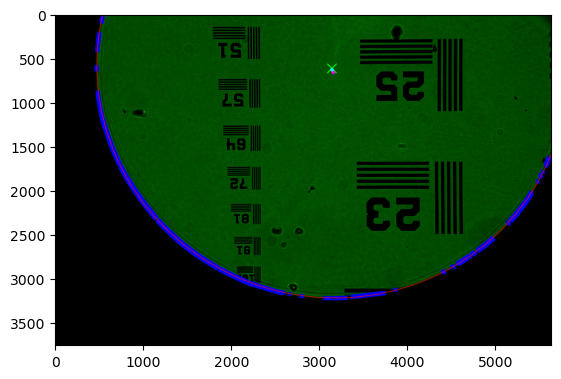

x: 17 y: 19 2023_03_15_16_02_07_img_shutter_05_x_17_y_19_r_0_g_1_b_0.tiff


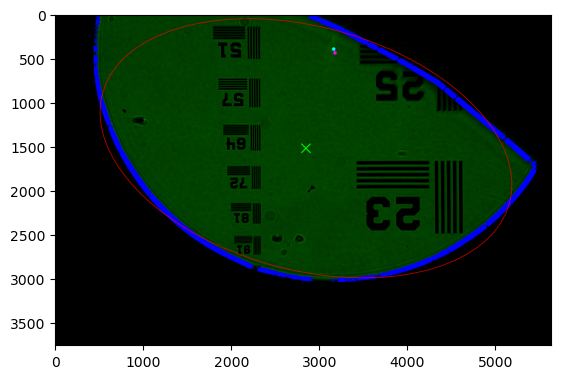

x: 17 y: 20 2023_03_15_16_02_07_img_shutter_05_x_17_y_20_r_0_g_1_b_0.tiff


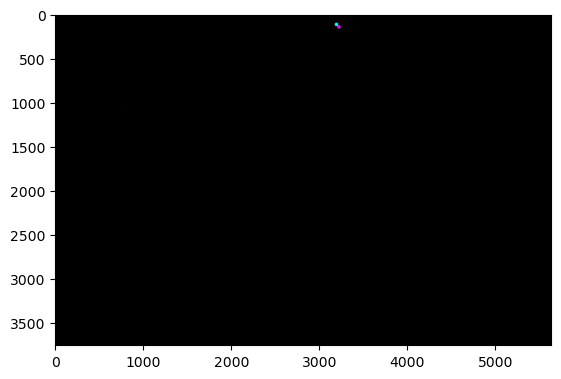

x: 18 y: 10 2023_03_15_16_02_07_img_shutter_05_x_18_y_10_r_0_g_1_b_0.tiff


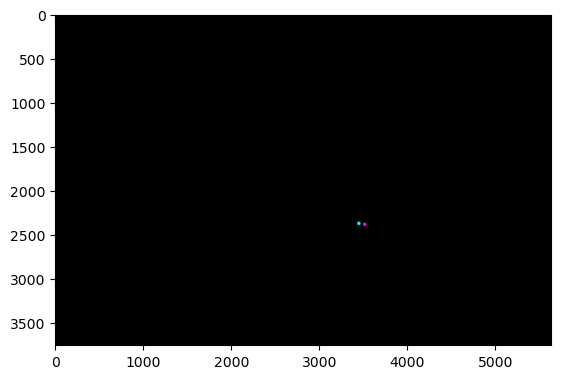

x: 18 y: 11 2023_03_15_16_02_07_img_shutter_05_x_18_y_11_r_0_g_1_b_0.tiff


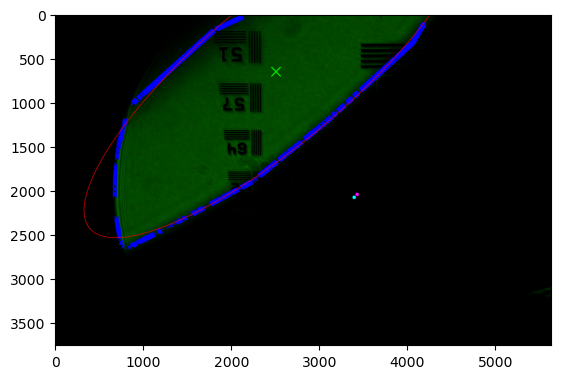

x: 18 y: 12 2023_03_15_16_02_07_img_shutter_05_x_18_y_12_r_0_g_1_b_0.tiff


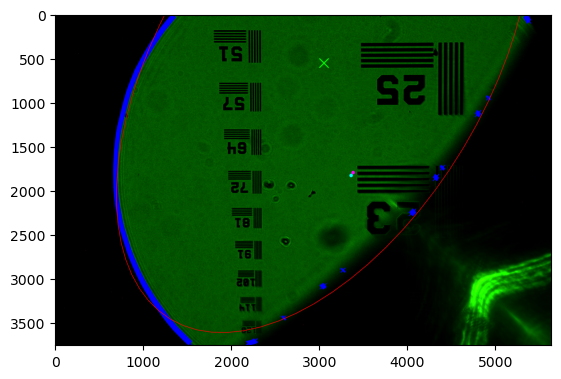

x: 18 y: 13 2023_03_15_16_02_07_img_shutter_05_x_18_y_13_r_0_g_1_b_0.tiff


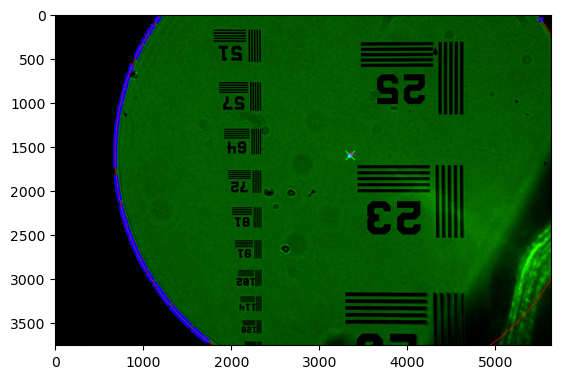

x: 18 y: 14 2023_03_15_16_02_07_img_shutter_05_x_18_y_14_r_0_g_1_b_0.tiff


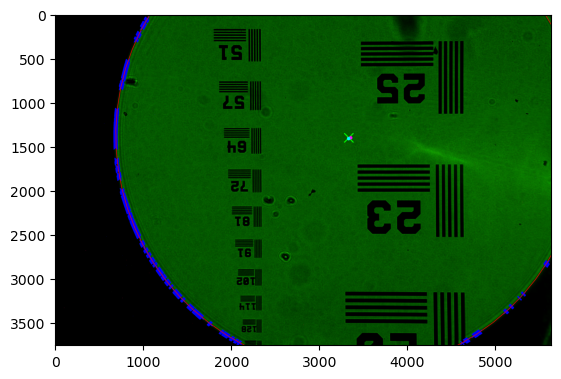

x: 18 y: 15 2023_03_15_16_02_07_img_shutter_05_x_18_y_15_r_0_g_1_b_0.tiff


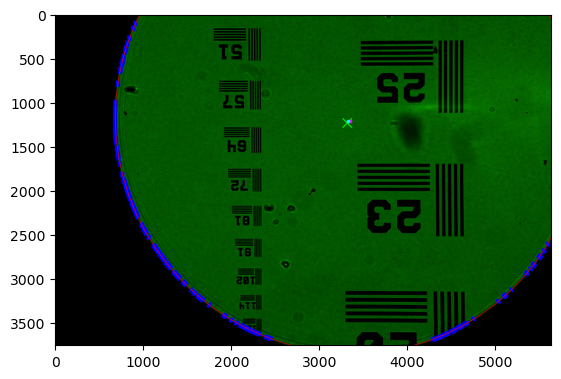

x: 18 y: 16 2023_03_15_16_02_07_img_shutter_05_x_18_y_16_r_0_g_1_b_0.tiff


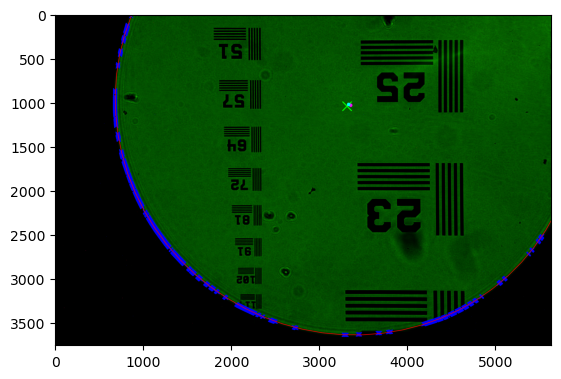

x: 18 y: 17 2023_03_15_16_02_07_img_shutter_05_x_18_y_17_r_0_g_1_b_0.tiff


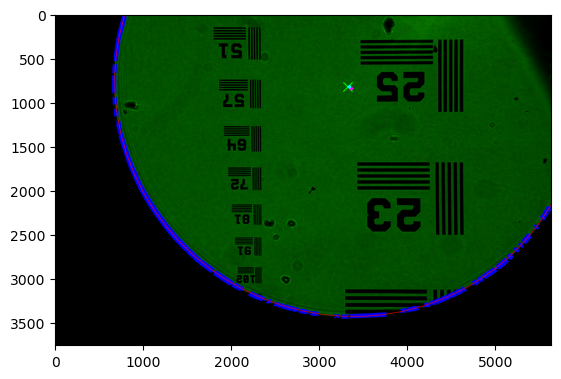

x: 18 y: 18 2023_03_15_16_02_07_img_shutter_05_x_18_y_18_r_0_g_1_b_0.tiff


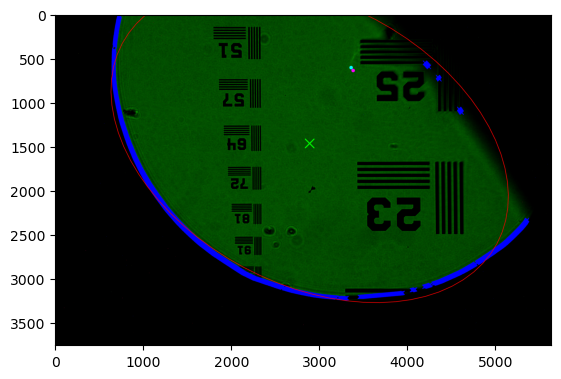

x: 18 y: 19 2023_03_15_16_02_07_img_shutter_05_x_18_y_19_r_0_g_1_b_0.tiff


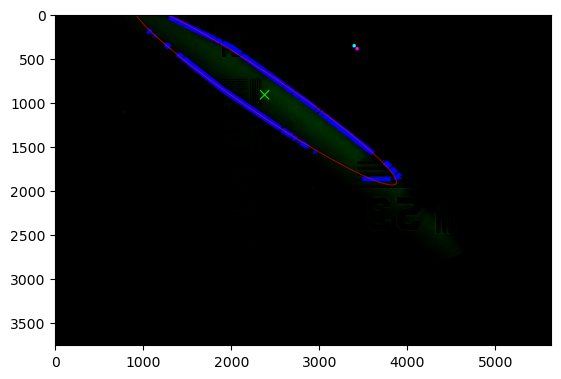

x: 18 y: 20 2023_03_15_16_02_07_img_shutter_05_x_18_y_20_r_0_g_1_b_0.tiff


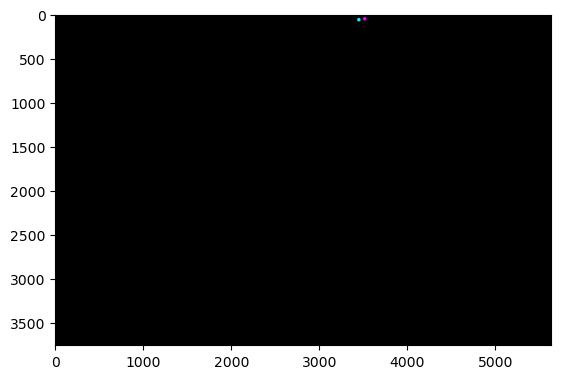

x: 19 y: 10 2023_03_15_16_02_07_img_shutter_05_x_19_y_10_r_0_g_1_b_0.tiff


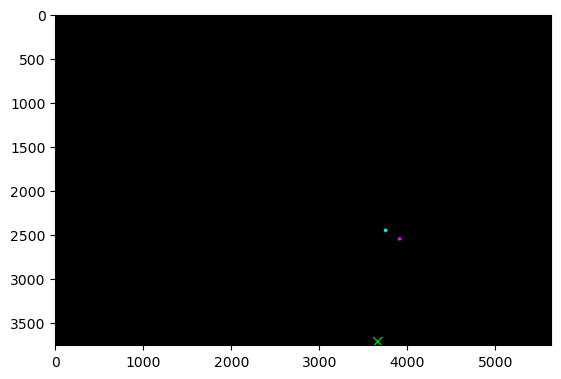

x: 19 y: 11 2023_03_15_16_02_07_img_shutter_05_x_19_y_11_r_0_g_1_b_0.tiff


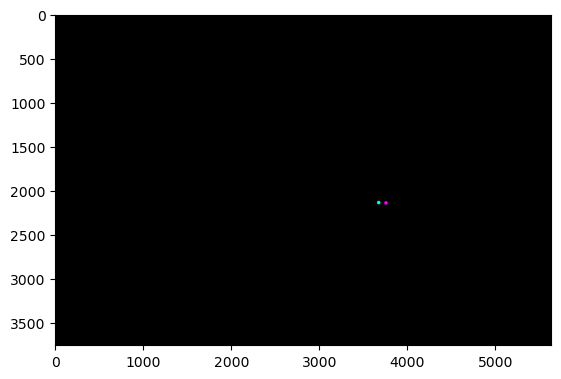

x: 19 y: 12 2023_03_15_16_02_07_img_shutter_05_x_19_y_12_r_0_g_1_b_0.tiff


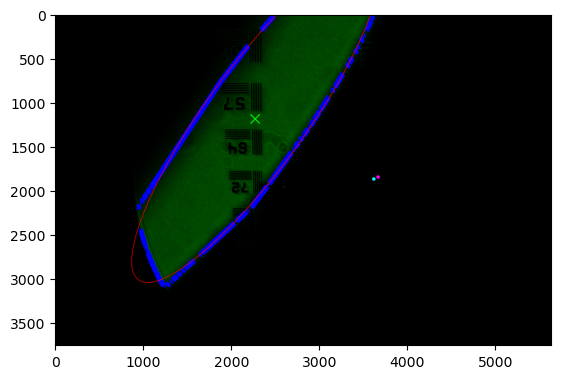

x: 19 y: 13 2023_03_15_16_02_07_img_shutter_05_x_19_y_13_r_0_g_1_b_0.tiff


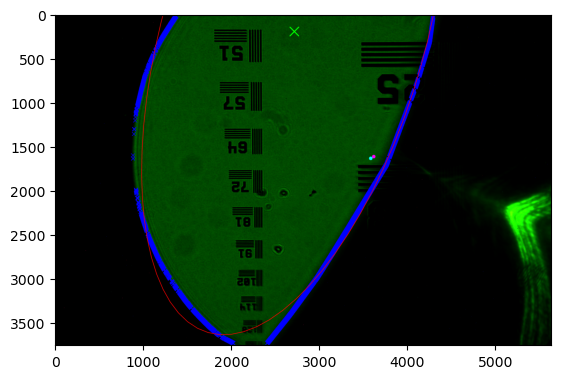

x: 19 y: 14 2023_03_15_16_02_07_img_shutter_05_x_19_y_14_r_0_g_1_b_0.tiff


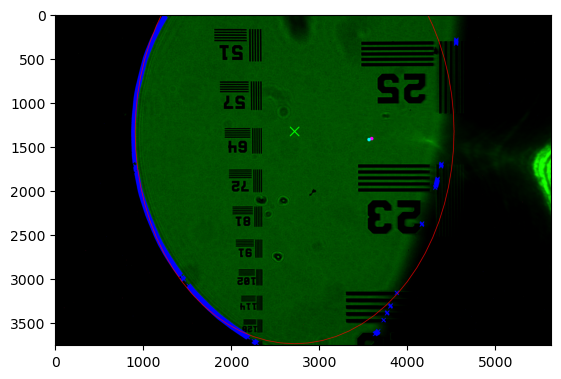

x: 19 y: 15 2023_03_15_16_02_07_img_shutter_05_x_19_y_15_r_0_g_1_b_0.tiff


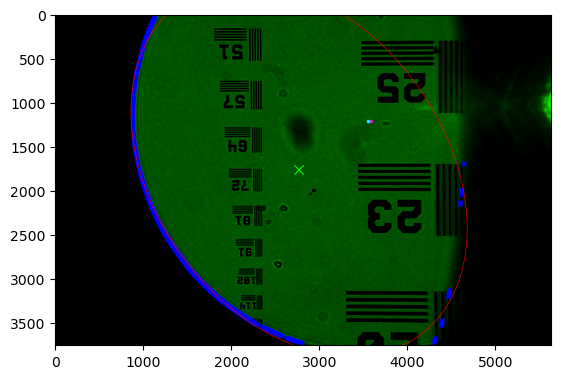

x: 19 y: 16 2023_03_15_16_02_07_img_shutter_05_x_19_y_16_r_0_g_1_b_0.tiff


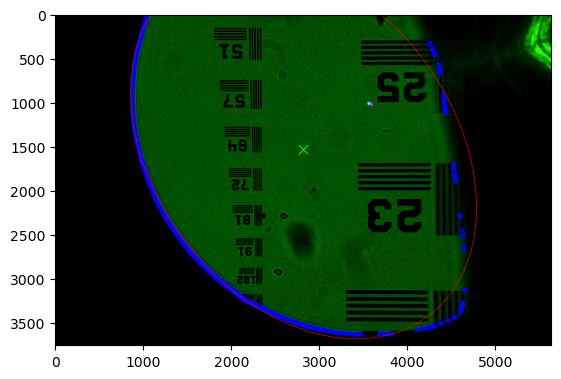

x: 19 y: 17 2023_03_15_16_02_07_img_shutter_05_x_19_y_17_r_0_g_1_b_0.tiff


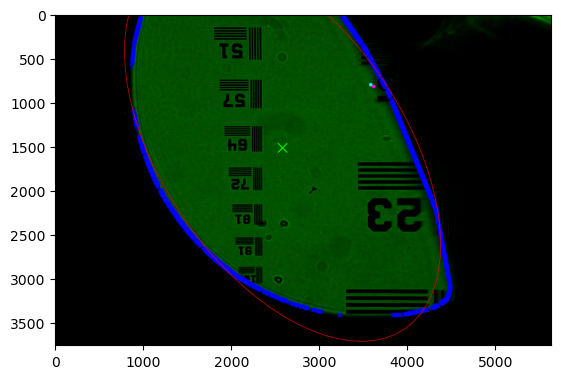

x: 19 y: 18 2023_03_15_16_02_07_img_shutter_05_x_19_y_18_r_0_g_1_b_0.tiff


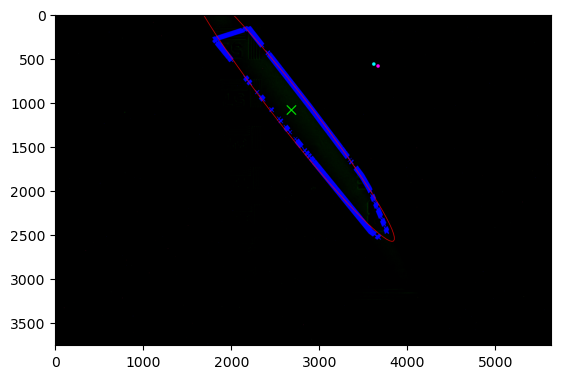

x: 19 y: 19 2023_03_15_16_02_07_img_shutter_05_x_19_y_19_r_0_g_1_b_0.tiff


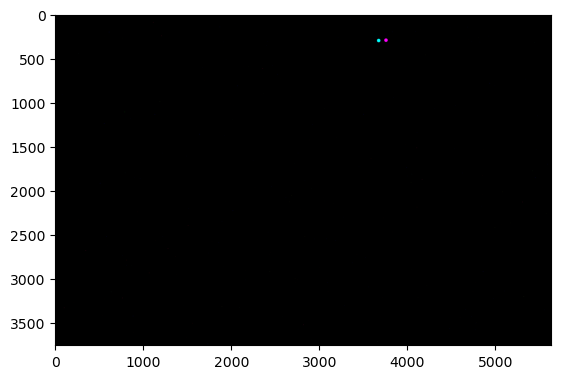

x: 19 y: 20 2023_03_15_16_02_07_img_shutter_05_x_19_y_20_r_0_g_1_b_0.tiff


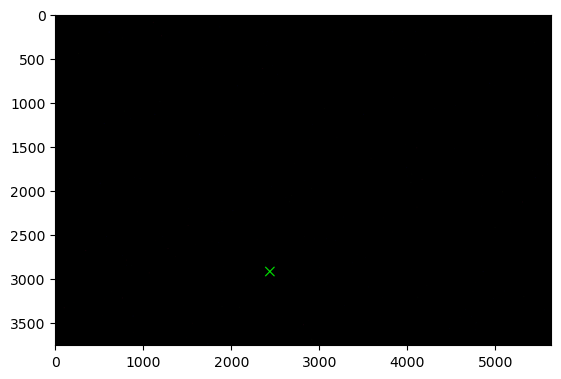

x: 20 y: 10 2023_03_15_16_02_07_img_shutter_05_x_20_y_10_r_0_g_1_b_0.tiff


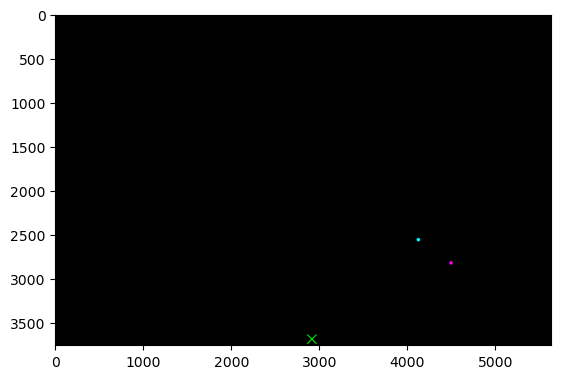

x: 20 y: 11 2023_03_15_16_02_07_img_shutter_05_x_20_y_11_r_0_g_1_b_0.tiff


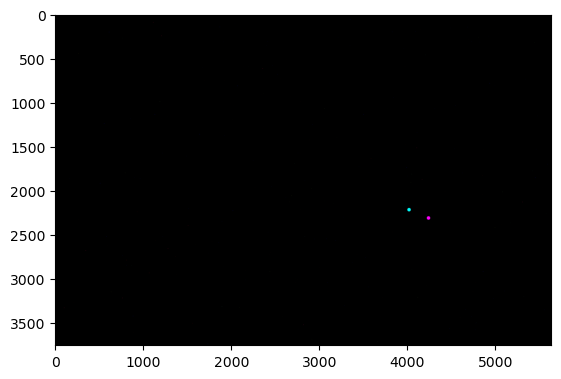

x: 20 y: 12 2023_03_15_16_02_07_img_shutter_05_x_20_y_12_r_0_g_1_b_0.tiff


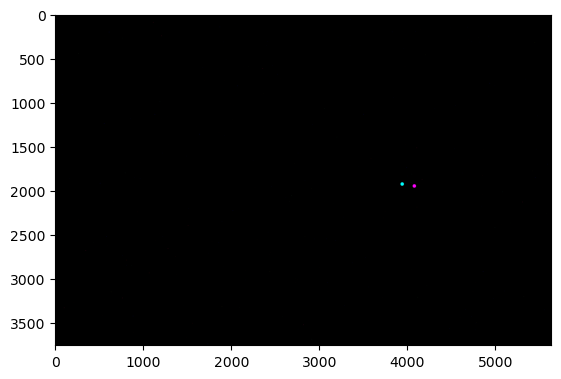

x: 20 y: 13 2023_03_15_16_02_07_img_shutter_05_x_20_y_13_r_0_g_1_b_0.tiff


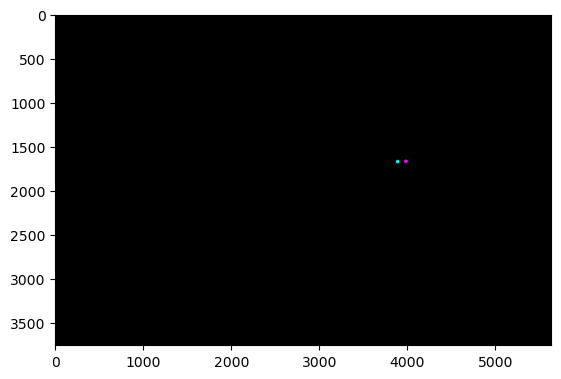

x: 20 y: 14 2023_03_15_16_02_07_img_shutter_05_x_20_y_14_r_0_g_1_b_0.tiff


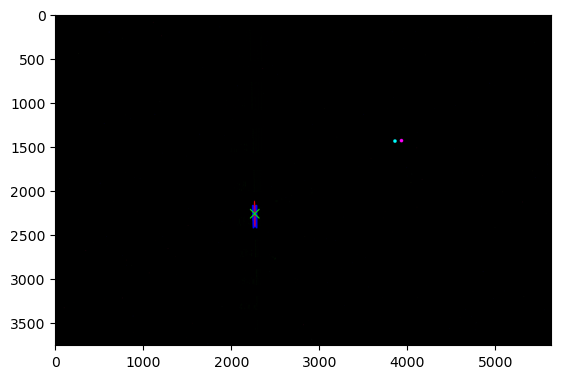

x: 20 y: 15 2023_03_15_16_02_07_img_shutter_05_x_20_y_15_r_0_g_1_b_0.tiff


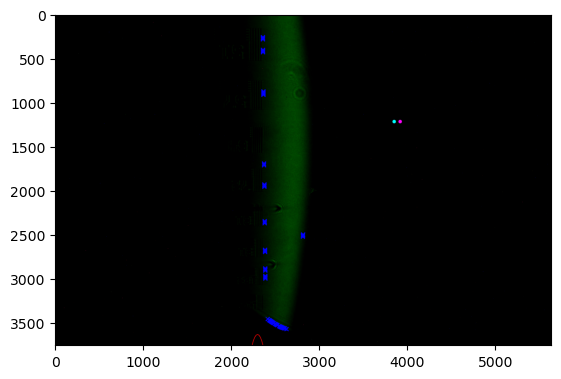

x: 20 y: 16 2023_03_15_16_02_07_img_shutter_05_x_20_y_16_r_0_g_1_b_0.tiff


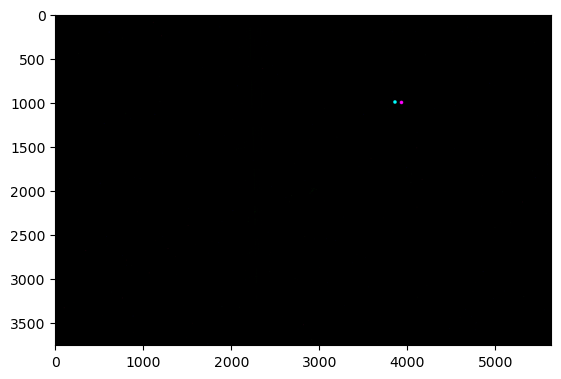

x: 20 y: 17 2023_03_15_16_02_07_img_shutter_05_x_20_y_17_r_0_g_1_b_0.tiff


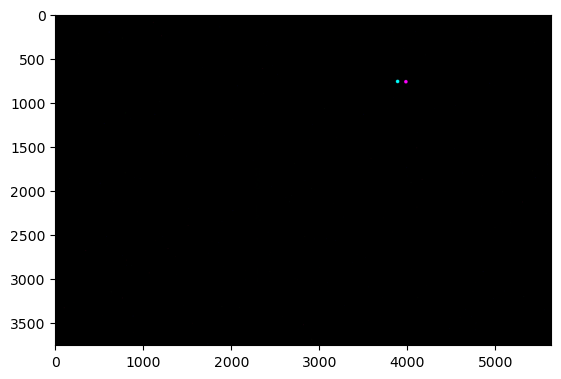

x: 20 y: 18 2023_03_15_16_02_07_img_shutter_05_x_20_y_18_r_0_g_1_b_0.tiff


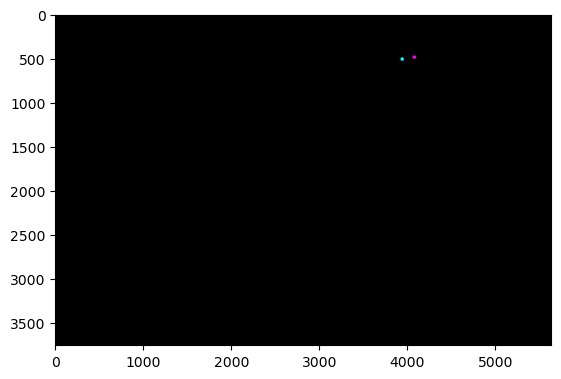

x: 20 y: 19 2023_03_15_16_02_07_img_shutter_05_x_20_y_19_r_0_g_1_b_0.tiff


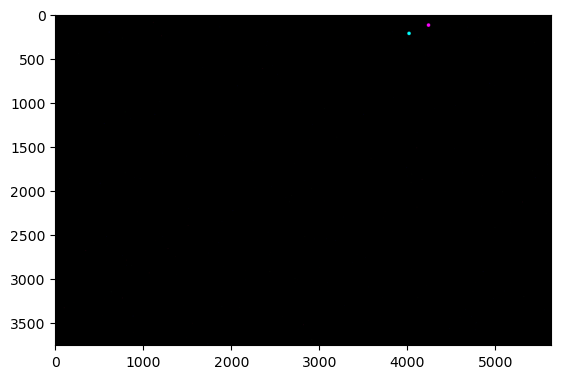

x: 20 y: 20 2023_03_15_16_02_07_img_shutter_05_x_20_y_20_r_0_g_1_b_0.tiff


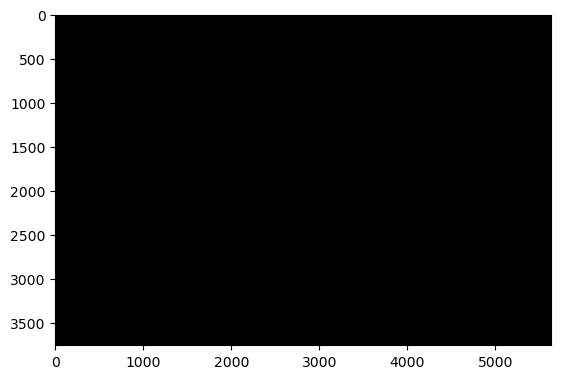

In [41]:
for x in range(10, 21):
    for y in range(10, 21):

        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"
        print('x:', x, 'y:', y, file_path)

        img = cv2.imread(dir_path + file_path, cv2.IMREAD_UNCHANGED)
        _, g_img, _ = cv2.split(img)

        img_8 = cv2.convertScaleAbs(img, alpha=(255/65535))
        g_img_8 = cv2.convertScaleAbs(g_img, alpha=(255/65535))

        center, axis_size, f = fit_ellipse_3(file_path, img_8, g_img_8, ifHull=True, method='opencv', save_path=None)

        cv2.circle(img_8, np.array(transformed_points.reshape([11, 11, 2])[x-10, y-10] + center_cords_undis[5, 5], dtype=np.uint16), 
                   20, (255, 0, 255), -1)
        cv2.circle(img_8, np.array((x_est.reshape([11, 11])[x-10, y-10] , y_est.reshape([11, 11])[x-10, y-10]) + center_cords_undis[5, 5], dtype=np.uint16), 
                   20, (0, 255, 255), -1)

        plt.imshow(img_8)
        plt.show()